## Library Import

In [ ]:
# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

import os, sys, gc, warnings, random

import datetime
import time
import dateutil.relativedelta

#python

import textwrap
from typing import Type, Union, Callable, Tuple, List, Optional, Dict, Any, Iterable
from abc import ABCMeta, abstractmethod
import zlib
import requests
from pathlib import Path
from collections import namedtuple
from scipy.special import expit

# Data manipulation
import pandas as pd 
import numpy as np
from sklearn.model_selection import train_test_split


# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Machine learning
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, precision_recall_curve, roc_curve
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold, GroupKFold
import xgboost as xgb
from catboost import CatBoostClassifier, Pool
import lightgbm as lgb

#pytorch

from pytorch_tabnet.tab_model import TabNetClassifier, TabNetRegressor
from pytorch_tabnet.pretraining import TabNetPretrainer

import torch
from torch import nn
from torch import Tensor
from torch.optim.optimizer import Optimizer
from torch.optim.lr_scheduler import _LRScheduler, ReduceLROnPlateau
from torch.utils.data import DataLoader
from torch.nn.functional import softmax
from torch.nn import functional as F

try:
    import pytorch_lightning as pl
except ImportError:
    HAS_PL = False
else:
    HAS_PL = True

#optuna

import optuna

#display

from tqdm.auto import tqdm

from IPython.display import display

%matplotlib inline

pd.options.display.max_rows = 10000
pd.options.display.max_columns = 1000
pd.options.display.max_colwidth = 1000

#tabular model

from tabular_model import *


## Fix Seed 함수 정의

In [ ]:
def seed_everything(seed=0):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    
SEED = 14
seed_everything(SEED)

def _set_seed(seed):
    # https://discuss.pytorch.org/t/reproducibility-with-all-the-bells-and-whistles
    random.seed(seed)

    np.random.seed(seed)

    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

## 레이블 생성 함수 정의

- 레이블 생성 함수는 연월을 인자로 받아서 고객 아이디별로 총 구매액이 인자로 받는 구매액 임계값을 넘는지 여부를 바이너리 레이블로 생성하는 함수

In [ ]:
TOTAL_THRES = 300

'''
    입력인자로 받는 year_month에 대해 고객 ID별로 총 구매액이
    구매액 임계값을 넘는지 여부의 binary label을 생성하는 함수
'''
def generate_label(df, year_month, total_thres=TOTAL_THRES, print_log=False):
    df = df.copy()
    
    # year_month에 해당하는 label 데이터 생성
    df['year_month'] = df['order_date'].dt.strftime('%Y-%m')
    df.reset_index(drop=True, inplace=True)

    # year_month 이전 월의 고객 ID 추출
    cust = df[df['year_month']<year_month]['customer_id'].unique()
    # year_month에 해당하는 데이터 선택
    df = df[df['year_month']==year_month]
    
    # label 데이터프레임 생성
    label = pd.DataFrame({'customer_id':cust})
    label['year_month'] = year_month
    
    # year_month에 해당하는 고객 ID의 구매액의 합 계산
    grped = df.groupby(['customer_id','year_month'], as_index=False)[['total']].sum()
    
    # label 데이터프레임과 merge하고 구매액 임계값을 넘었는지 여부로 label 생성
    label = label.merge(grped, on=['customer_id','year_month'], how='left')
    label['total'].fillna(0.0, inplace=True)
    label['label'] = (label['total'] > total_thres).astype(int)

    # 고객 ID로 정렬
    label = label.sort_values('customer_id').reset_index(drop=True)
    if print_log: print(f'{year_month} - final label shape: {label.shape}')
    
    return label

## 평가지표 출력 함수 정의

In [ ]:
def print_score(label, pred, prob_thres=0.5):
    print('Precision: {:.5f}'.format(precision_score(label, pred>prob_thres)))
    print('Recall: {:.5f}'.format(recall_score(label, pred>prob_thres)))
    print('F1 Score: {:.5f}'.format(f1_score(label, pred>prob_thres)))
    print('ROC AUC Score: {:.5f}'.format(roc_auc_score(label, pred)))

## 데이터 전처리 함수 정의
- 범주형 변수 레이블 인코딩
- 결측치 중위값으로 채움

In [ ]:
def feature_preprocessing(train, test, features, do_imputing=True):
    x_tr = train.copy()
    x_te = test.copy()
    
    # 범주형 피처 이름을 저장할 변수
    cate_cols = []

    # 레이블 인코딩
    for f in features:
        if x_tr[f].dtype.name == 'object': # 데이터 타입이 object(str)이면 레이블 인코딩
            cate_cols.append(f)
            le = LabelEncoder()
            # train + test 데이터를 합쳐서 레이블 인코딩 함수에 fit
            le.fit(list(x_tr[f].values) + list(x_te[f].values))
            
            # train 데이터 레이블 인코딩 변환 수행
            x_tr[f] = le.transform(list(x_tr[f].values))
            
            # test 데이터 레이블 인코딩 변환 수행
            x_te[f] = le.transform(list(x_te[f].values))

    print('categorical feature:', cate_cols)

    if do_imputing:
        # 중위값으로 결측치 채우기
        imputer = SimpleImputer(strategy='median')

        x_tr[features] = imputer.fit_transform(x_tr[features])
        x_te[features] = imputer.transform(x_te[features])
    
    return x_tr, x_te

## 피처 엔지니어링 함수 정의
- Pandas groupby aggregation 함수를 사용한 피처 엔지니어링

In [ ]:
def feature_engineering1(df, year_month):
    df = df.copy()
    
    # year_month 이전 월 계산
    d = datetime.datetime.strptime(year_month, "%Y-%m")
    prev_ym = d - dateutil.relativedelta.relativedelta(months=1)
    prev_ym = prev_ym.strftime('%Y-%m')
    
    # train, test 데이터 선택
    train = df[df['order_date'] < prev_ym]
    test = df[df['order_date'] < year_month]
    
    # train, test 레이블 데이터 생성
    train_label = generate_label(df, prev_ym)[['customer_id','year_month','label']]
    test_label = generate_label(df, year_month)[['customer_id','year_month','label']]
    
    # group by aggregation 함수 선언
    agg_func = ['mean','max','min','sum','count','std','skew']
    all_train_data = pd.DataFrame()
    
    for i, tr_ym in enumerate(train_label['year_month'].unique()):
        # group by aggretation 함수로 train 데이터 피처 생성
        train_agg = train.loc[train['order_date'] < tr_ym].groupby(['customer_id']).agg(agg_func)

        # 멀티 레벨 컬럼을 사용하기 쉽게 1 레벨 컬럼명으로 변경
        new_cols = []
        for col in train_agg.columns.levels[0]:
            for stat in train_agg.columns.levels[1]:
                new_cols.append(f'{col}-{stat}')

        train_agg.columns = new_cols
        train_agg.reset_index(inplace = True)
        
        train_agg['year_month'] = tr_ym
        
        all_train_data = all_train_data.append(train_agg)
    
    all_train_data = train_label.merge(all_train_data, on=['customer_id', 'year_month'], how='left')
    features = all_train_data.drop(columns=['customer_id', 'label', 'year_month']).columns
    
    # group by aggretation 함수로 test 데이터 피처 생성
    test_agg = test.groupby(['customer_id']).agg(agg_func)
    test_agg.columns = new_cols
    
    test_data = test_label.merge(test_agg, on=['customer_id'], how='left')

    # train, test 데이터 전처리
    x_tr, x_te = feature_preprocessing(all_train_data, test_data, features)
    
    print('x_tr.shape', x_tr.shape, ', x_te.shape', x_te.shape)
    
    return x_tr, x_te, all_train_data['label'], features

## LightGBM cross validation out of fold train/predict 함수 정의

In [ ]:
def make_lgb_oof_prediction(train, y, test, features, categorical_features='auto', model_params=None, folds=10):
    x_train = train[features]
    x_test = test[features]
    
    # 테스트 데이터 예측값을 저장할 변수
    test_preds = np.zeros(x_test.shape[0])
    
    # Out Of Fold Validation 예측 데이터를 저장할 변수
    y_oof = np.zeros(x_train.shape[0])
    
    # 폴드별 평균 Validation 스코어를 저장할 변수
    score = 0
    
    # 피처 중요도를 저장할 데이터 프레임 선언
    fi = pd.DataFrame()
    fi['feature'] = features
    
    # Stratified K Fold 선언
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=SEED)

    for fold, (tr_idx, val_idx) in enumerate(skf.split(x_train, y)):
        # train index, validation index로 train 데이터를 나눔
        x_tr, x_val = x_train.loc[tr_idx, features], x_train.loc[val_idx, features]
        y_tr, y_val = y[tr_idx], y[val_idx]
        
        print(f'fold: {fold+1}, x_tr.shape: {x_tr.shape}, x_val.shape: {x_val.shape}')

        # LightGBM 데이터셋 선언
        dtrain = lgb.Dataset(x_tr, label=y_tr)
        dvalid = lgb.Dataset(x_val, label=y_val)
        
        # LightGBM 모델 훈련
        clf = lgb.train(
            model_params,
            dtrain,
            valid_sets=[dtrain, dvalid], # Validation 성능을 측정할 수 있도록 설정
            categorical_feature=categorical_features,
            verbose_eval=200
        )

        # Validation 데이터 예측
        val_preds = clf.predict(x_val)
        
        # Validation index에 예측값 저장 
        y_oof[val_idx] = val_preds
        
        # 폴드별 Validation 스코어 측정
        print(f"Fold {fold + 1} | AUC: {roc_auc_score(y_val, val_preds)}")
        print('-'*80)

        # score 변수에 폴드별 평균 Validation 스코어 저장
        score += roc_auc_score(y_val, val_preds) / folds
        
        # 테스트 데이터 예측하고 평균해서 저장
        test_preds += clf.predict(x_test) / folds
        
        # 폴드별 피처 중요도 저장
        fi[f'fold_{fold+1}'] = clf.feature_importance()

        del x_tr, x_val, y_tr, y_val
        gc.collect()
        
    print(f"\nMean AUC = {score}") # 폴드별 Validation 스코어 출력
    print(f"OOF AUC = {roc_auc_score(y, y_oof)}") # Out Of Fold Validation 스코어 출력
        
    # 폴드별 피처 중요도 평균값 계산해서 저장 
    fi_cols = [col for col in fi.columns if 'fold_' in col]
    fi['importance'] = fi[fi_cols].mean(axis=1)
    
    return y_oof, test_preds, fi

## xgboost prediction 정의

In [ ]:
def make_xgb_oof_prediction(train, y, test, features, model_params=None, folds=10):
    x_train = train[features]
    x_test = test[features]
    
    # 테스트 데이터 예측값을 저장할 변수
    test_preds = np.zeros(x_test.shape[0])
    
    # Out Of Fold Validation 예측 데이터를 저장할 변수
    y_oof = np.zeros(x_train.shape[0])
    
    # 폴드별 평균 Validation 스코어를 저장할 변수
    score = 0
    
    # 피처 중요도를 저장할 데이터 프레임 선언
    fi = pd.DataFrame()
    fi['feature'] = features
    
    # Stratified K Fold 선언
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=SEED)

    for fold, (tr_idx, val_idx) in enumerate(skf.split(x_train, y)):
        # train index, validation index로 train 데이터를 나눔
        x_tr, x_val = x_train.loc[tr_idx, features], x_train.loc[val_idx, features]
        y_tr, y_val = y[tr_idx], y[val_idx]
        
        print(f'fold: {fold+1}, x_tr.shape: {x_tr.shape}, x_val.shape: {x_val.shape}')

        # XGBoost 데이터셋 선언
        dtrain = xgb.DMatrix(x_tr, label=y_tr)
        dvalid = xgb.DMatrix(x_val, label=y_val)
        dtest = xgb.DMatrix(x_test)
        
        dlist = [(dtrain, 'train'), (dvalid,'eval')]
        
        # XGBoost 모델 훈련
        clf = xgb.train(
            model_params,
            dtrain,
            evals=dlist, # Validation 성능을 측정할 수 있도록 설정
            num_boost_round=10000,
            early_stopping_rounds=100,
            verbose_eval=200
        )

        # Validation 데이터 예측
        val_preds = clf.predict(dvalid)
        
        # Validation index에 예측값 저장 
        y_oof[val_idx] = val_preds
        
        # 폴드별 Validation 스코어 측정
        print(f"Fold {fold + 1} | AUC: {roc_auc_score(y_val, val_preds)}")
        print('-'*80)

        # score 변수에 폴드별 평균 Validation 스코어 저장
        score += roc_auc_score(y_val, val_preds) / folds
        
        # 테스트 데이터 예측하고 평균해서 저장
        test_preds += clf.predict(dtest) / folds
        
        # 폴드별 피처 중요도 저장
        feature_importance = np.array(clf.get_score().values())
        fi[f'fold_{fold+1}'] = feature_importance

        del x_tr, x_val, y_tr, y_val
        gc.collect()
        
    print(f"\nMean AUC = {score}") # 폴드별 Validation 스코어 출력
    print(f"OOF AUC = {roc_auc_score(y, y_oof)}") # Out Of Fold Validation 스코어 출력
        
    # 폴드별 피처 중요도 평균값 계산해서 저장 
    fi_cols = [col for col in fi.columns if 'fold_' in col]
    fi['importance'] = fi[fi_cols].mean(axis=1)
    
    return y_oof, test_preds, fi

# CatBoost prediction 정의

In [ ]:
def make_cbt_oof_prediction(train, y, test, features, model_params=None, folds=10):
    x_train = train[features]
    x_test = test[features]
    
    # 테스트 데이터 예측값을 저장할 변수
    test_preds = np.zeros(x_test.shape[0])
    
    # Out Of Fold Validation 예측 데이터를 저장할 변수
    y_oof = np.zeros(x_train.shape[0])
    
    # 폴드별 평균 Validation 스코어를 저장할 변수
    score = 0
    
    # 피처 중요도를 저장할 데이터 프레임 선언
    fi = pd.DataFrame()
    fi['feature'] = features
    
    # Stratified K Fold 선언
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=SEED)

    for fold, (tr_idx, val_idx) in enumerate(skf.split(x_train, y)):
        # train index, validation index로 train 데이터를 나눔
        x_tr, x_val = x_train.loc[tr_idx, features], x_train.loc[val_idx, features]
        y_tr, y_val = y[tr_idx], y[val_idx]
        
        print(f'fold: {fold+1}, x_tr.shape: {x_tr.shape}, x_val.shape: {x_val.shape}')

        # CatBoost 데이터셋 선언
        #dtrain = Pool(x_tr, label=y_tr)
        #dvalid = Pool(x_val, label=y_val)
        #dtest = Pool(x_test)
        
        #dlist = [(dtrain, 'train'), (dvalid,'eval')]
        
        # CatBoostClasssifier 모델 훈련
        clf = CatBoostClassifier(**model_params)

        clf.fit(x_tr,y_tr,eval_set=(x_val,y_val),
                #cat_features=categorical_features,
                use_best_model=True,
                verbose=True,
                #verbose_eval=200
               )

        # Validation 데이터 예측
        val_preds = clf.predict_proba(x_val)
        
        # Validation index에 예측값 저장 
        y_oof[val_idx] = val_preds[:,1]
        
        # 폴드별 Validation 스코어 측정
        print(f"Fold {fold + 1} | AUC: {roc_auc_score(y_val, val_preds[:,1])}")
        print('-'*80)

        # score 변수에 폴드별 평균 Validation 스코어 저장
        score += roc_auc_score(y_val, val_preds[:,1]) / folds
        
        # 테스트 데이터 예측하고 평균해서 저장
        test_preds += clf.predict_proba(x_test)[:,1] / folds
        
        # 폴드별 피처 중요도 저장
        fi[f'fold_{fold+1}'] = clf.get_feature_importance()

        del x_tr, x_val, y_tr, y_val
        gc.collect()
        
    print(f"\nMean AUC = {score}") # 폴드별 Validation 스코어 출력
    print(f"OOF AUC = {roc_auc_score(y, y_oof)}") # Out Of Fold Validation 스코어 출력
        
    # 폴드별 피처 중요도 평균값 계산해서 저장 
    fi_cols = [col for col in fi.columns if 'fold_' in col]
    fi['importance'] = fi[fi_cols].mean(axis=1)
    
    return y_oof, test_preds, fi

## LightGBM 피처 중요도 플롯 함수 정의

In [ ]:
def plot_feature_importances(df, n=20, color='blue', figsize=(12,8)):
    # 피처 중요도 순으로 내림차순 정렬
    df = df.sort_values('importance', ascending = False).reset_index(drop = True)
    
    # 피처 중요도 정규화 및 누적 중요도 계산
    df['importance_normalized'] = df['importance'] / df['importance'].sum()
    df['cumulative_importance'] = np.cumsum(df['importance_normalized'])
    
    plt.rcParams['font.size'] = 12
    plt.style.use('fivethirtyeight')
    # 피처 중요도 순으로 n개까지 바플롯으로 그리기
    df.loc[:n, :].plot.barh(y='importance_normalized', 
                            x='feature', color=color, 
                            edgecolor='k', figsize=figsize,
                            legend=False)

    plt.xlabel('Normalized Importance', size=18); plt.ylabel(''); 
    plt.title(f'Top {n} Most Important Features', size=18)
    plt.gca().invert_yaxis()
    
    return df

## Train 데이터 읽기
- 9개의 feature를 가진 780502개의 train data

In [ ]:
data = pd.read_csv("/content/train.csv", parse_dates=["order_date"])
print(data.shape) # data shape 확인
data.head()

(780502, 9)


,order_id,product_id,description,quantity,order_date,price,customer_id,country,total
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,11.4675,13085,United Kingdom,137.61
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,11.1375,13085,United Kingdom,133.65
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,11.1375,13085,United Kingdom,133.65
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,3.4650,13085,United Kingdom,166.32
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,2.0625,13085,United Kingdom,49.50


## cumsum feature 생성

In [ ]:
#train feature 생성

df = data.copy()

year_month = '2011-11'

df_label = generate_label(df,year_month)[['customer_id','year_month','label']]

df = df[df['order_date']<year_month]

df['cumsum_total_by_cust_id'] = df.groupby(['customer_id'])['total'].cumsum()
df['cumsum_quantity_by_cust_id'] = df.groupby(['customer_id'])['quantity'].cumsum()
df['cumsum_price_by_cust_id'] = df.groupby(['customer_id'])['price'].cumsum()

df['cumsum_total_by_prod_id'] = df.groupby(['product_id'])['total'].cumsum()
df['cumsum_quantity_by_prod_id'] = df.groupby(['product_id'])['quantity'].cumsum()
df['cumsum_price_by_prod_id'] = df.groupby(['product_id'])['price'].cumsum()

df['cumsum_total_by_order_id'] = df.groupby(['order_id'])['total'].cumsum()
df['cumsum_quantity_by_order_id'] = df.groupby(['order_id'])['quantity'].cumsum()
df['cumsum_price_by_order_id'] = df.groupby(['order_id'])['price'].cumsum()

cols = [col for col in df.columns if 'cumsum' in col]

agg_func = ['mean','max','min','sum','count','std','skew']

df_agg = df.groupby(['customer_id'])[cols].agg(agg_func)

new_cols = []

for col in df_agg.columns.levels[0]:
    for stat in df_agg.columns.levels[1]:
        new_cols.append(f'{col}-{stat}')

df_agg.columns = new_cols

df_all = df_label.merge(df_agg,on=['customer_id'],how='left')
df_all.head(10)

,customer_id,year_month,label,cumsum_total_by_cust_id-mean,cumsum_total_by_cust_id-max,cumsum_total_by_cust_id-min,cumsum_total_by_cust_id-sum,cumsum_total_by_cust_id-count,cumsum_total_by_cust_id-std,cumsum_total_by_cust_id-skew,cumsum_quantity_by_cust_id-mean,cumsum_quantity_by_cust_id-max,cumsum_quantity_by_cust_id-min,cumsum_quantity_by_cust_id-sum,cumsum_quantity_by_cust_id-count,cumsum_quantity_by_cust_id-std,cumsum_quantity_by_cust_id-skew,cumsum_price_by_cust_id-mean,cumsum_price_by_cust_id-max,cumsum_price_by_cust_id-min,cumsum_price_by_cust_id-sum,cumsum_price_by_cust_id-count,cumsum_price_by_cust_id-std,cumsum_price_by_cust_id-skew,cumsum_total_by_prod_id-mean,cumsum_total_by_prod_id-max,cumsum_total_by_prod_id-min,cumsum_total_by_prod_id-sum,cumsum_total_by_prod_id-count,cumsum_total_by_prod_id-std,cumsum_total_by_prod_id-skew,cumsum_quantity_by_prod_id-mean,cumsum_quantity_by_prod_id-max,cumsum_quantity_by_prod_id-min,cumsum_quantity_by_prod_id-sum,cumsum_quantity_by_prod_id-count,cumsum_quantity_by_prod_id-std,cumsum_quantity_by_prod_id-skew,cumsum_price_by_prod_id-mean,cumsum_price_by_prod_id-max,cumsum_price_by_prod_id-min,cumsum_price_by_prod_id-sum,cumsum_price_by_prod_id-count,cumsum_price_by_prod_id-std,cumsum_price_by_prod_id-skew,cumsum_total_by_order_id-mean,cumsum_total_by_order_id-max,cumsum_total_by_order_id-min,cumsum_total_by_order_id-sum,cumsum_total_by_order_id-count,cumsum_total_by_order_id-std,cumsum_total_by_order_id-skew,cumsum_quantity_by_order_id-mean,cumsum_quantity_by_order_id-max,cumsum_quantity_by_order_id-min,cumsum_quantity_by_order_id-sum,cumsum_quantity_by_order_id-count,cumsum_quantity_by_order_id-std,cumsum_quantity_by_order_id-skew,cumsum_price_by_order_id-mean,cumsum_price_by_order_id-max,cumsum_price_by_order_id-min,cumsum_price_by_order_id-sum,cumsum_price_by_order_id-count,cumsum_price_by_order_id-std,cumsum_price_by_order_id-skew
0,12346,2011-11,0,2953.304457,127267.5690,-85.3710,138805.3095,47,18527.811314,6.855058,1631.063830,74268,10,76660,47,10825.525671,6.855636,400.641415,936.3750,7.4250,18830.1465,47,262.090504,0.440160,-18933.867255,127352.9400,-145015.2000,-8.898918e+05,47,64968.445670,-1.131166,2354.212766,74215,-1644,110648,47,10767.598390,6.742285,63650.017691,325951.2630,1.6500,2.991551e+06,47,128903.599171,1.619409,24.297128,127352.9400,-127352.9400,1141.9650,47,26555.274233,-0.002867,3.914894,74215,-74215,184,47,15474.899161,-0.000793,80.737660,412.5990,1.6500,3794.6700,47,87.485676,1.486909
1,12347,2011-11,0,3491.749628,7749.5715,29.2050,736759.1715,211,2302.307503,0.228741,1339.677725,2775,6,282672,211,792.187394,0.085304,427.582329,892.6995,4.8675,90219.8715,211,277.079011,0.107158,16340.371493,406502.2830,156.3375,3.447818e+06,211,47293.442526,6.402293,5018.199052,50996,56,1058840,211,8338.776884,2.895244,2199.501924,70264.2600,8.2500,4.640949e+05,211,7974.127747,6.790150,627.874187,2135.6280,21.7800,132481.4535,211,493.241526,1.234591,224.853081,676,4,47444,211,160.673737,0.694310,71.500443,199.2540,0.9075,15086.5935,211,48.486089,0.663454
2,12348,2011-11,0,1096.986000,3332.0100,21.7800,55946.2860,51,1000.019165,0.812596,1069.450980,2714,24,54542,51,902.451734,0.493378,66.215794,318.6150,0.9075,3377.0055,51,79.524917,1.597336,17500.335471,146857.4085,471.2400,8.925171e+05,51,27894.026806,3.120231,11485.372549,35932,336,585754,51,11056.078952,0.673806,5104.847000,95332.3635,25.1955,2.603472e+05,51,16507.639799,4.106796,375.299294,1473.1200,21.7800,19140.2640,51,300.618991,1.639190,388.392157,1254,24,19808,51,333.951917,1.339273,14.115588,81.8400,0.4785,719.8950,51,18.844181,2.593528
3,12349,2011-11,1,2014.247369,4367.5335,-39.8475,215524.4685,107,1402.866250,0.089354,467.682243,988,-5,50042,107,273.727436,-0.077728,615.014523,1484.1585,6.1875,65806.5540,107,484.322565,0.447134,8876.528131,86587.3965,74.2500,9.497885e+05,107,12932.316422,3.313619,2352.869159,33089,12,251757,107,4244.373963,4.872195,1555.892636,30169.8210,24.2550,1.664805e+05,107,3418.294904,

In [ ]:
#test feature 생성

df = data.copy()

year_month = '2011-12'

df_label = generate_label(df,year_month)[['customer_id','year_month','label']]

df = df[df['order_date']<year_month]

df['cumsum_total_by_cust_id'] = df.groupby(['customer_id'])['total'].cumsum()
df['cumsum_quantity_by_cust_id'] = df.groupby(['customer_id'])['quantity'].cumsum()
df['cumsum_price_by_cust_id'] = df.groupby(['customer_id'])['price'].cumsum()

df['cumsum_total_by_prod_id'] = df.groupby(['product_id'])['total'].cumsum()
df['cumsum_quantity_by_prod_id'] = df.groupby(['product_id'])['quantity'].cumsum()
df['cumsum_price_by_prod_id'] = df.groupby(['product_id'])['price'].cumsum()

df['cumsum_total_by_order_id'] = df.groupby(['order_id'])['total'].cumsum()
df['cumsum_quantity_by_order_id'] = df.groupby(['order_id'])['quantity'].cumsum()
df['cumsum_price_by_order_id'] = df.groupby(['order_id'])['price'].cumsum()

cols = [col for col in df.columns if 'cumsum' in col]

agg_func = ['mean','max','min','sum','count','std','skew']

df_agg_test = df.groupby(['customer_id'])[cols].agg(agg_func)

new_cols = []

for col in df_agg_test.columns.levels[0]:
    for stat in df_agg_test.columns.levels[1]:
        new_cols.append(f'{col}-{stat}')

df_agg_test.columns = new_cols

df_all_test = df_label.merge(df_agg_test,on=['customer_id'],how='left')
df_all_test.head(10)

,customer_id,year_month,label,cumsum_total_by_cust_id-mean,cumsum_total_by_cust_id-max,cumsum_total_by_cust_id-min,cumsum_total_by_cust_id-sum,cumsum_total_by_cust_id-count,cumsum_total_by_cust_id-std,cumsum_total_by_cust_id-skew,cumsum_quantity_by_cust_id-mean,cumsum_quantity_by_cust_id-max,cumsum_quantity_by_cust_id-min,cumsum_quantity_by_cust_id-sum,cumsum_quantity_by_cust_id-count,cumsum_quantity_by_cust_id-std,cumsum_quantity_by_cust_id-skew,cumsum_price_by_cust_id-mean,cumsum_price_by_cust_id-max,cumsum_price_by_cust_id-min,cumsum_price_by_cust_id-sum,cumsum_price_by_cust_id-count,cumsum_price_by_cust_id-std,cumsum_price_by_cust_id-skew,cumsum_total_by_prod_id-mean,cumsum_total_by_prod_id-max,cumsum_total_by_prod_id-min,cumsum_total_by_prod_id-sum,cumsum_total_by_prod_id-count,cumsum_total_by_prod_id-std,cumsum_total_by_prod_id-skew,cumsum_quantity_by_prod_id-mean,cumsum_quantity_by_prod_id-max,cumsum_quantity_by_prod_id-min,cumsum_quantity_by_prod_id-sum,cumsum_quantity_by_prod_id-count,cumsum_quantity_by_prod_id-std,cumsum_quantity_by_prod_id-skew,cumsum_price_by_prod_id-mean,cumsum_price_by_prod_id-max,cumsum_price_by_prod_id-min,cumsum_price_by_prod_id-sum,cumsum_price_by_prod_id-count,cumsum_price_by_prod_id-std,cumsum_price_by_prod_id-skew,cumsum_total_by_order_id-mean,cumsum_total_by_order_id-max,cumsum_total_by_order_id-min,cumsum_total_by_order_id-sum,cumsum_total_by_order_id-count,cumsum_total_by_order_id-std,cumsum_total_by_order_id-skew,cumsum_quantity_by_order_id-mean,cumsum_quantity_by_order_id-max,cumsum_quantity_by_order_id-min,cumsum_quantity_by_order_id-sum,cumsum_quantity_by_order_id-count,cumsum_quantity_by_order_id-std,cumsum_quantity_by_order_id-skew,cumsum_price_by_order_id-mean,cumsum_price_by_order_id-max,cumsum_price_by_order_id-min,cumsum_price_by_order_id-sum,cumsum_price_by_order_id-count,cumsum_price_by_order_id-std,cumsum_price_by_order_id-skew
0,12346,2011-12,0,2953.304457,127267.5690,-85.3710,138805.3095,47,18527.811314,6.855058,1631.063830,74268,10,76660,47,10825.525671,6.855636,400.641415,936.3750,7.4250,18830.1465,47,262.090504,0.440160,-18933.867255,127352.9400,-145015.2000,-8.898918e+05,47,64968.445670,-1.131166,2354.212766,74215,-1644,110648,47,10767.598390,6.742285,63650.017691,325951.2630,1.6500,2.991551e+06,47,128903.599171,1.619409,24.297128,127352.9400,-127352.9400,1141.9650,47,26555.274233,-0.002867,3.914894,74215,-74215,184,47,15474.899161,-0.000793,80.737660,412.5990,1.6500,3794.6700,47,87.485676,1.486909
1,12347,2011-12,0,3491.749628,7749.5715,29.2050,736759.1715,211,2302.307503,0.228741,1339.677725,2775,6,282672,211,792.187394,0.085304,427.582329,892.6995,4.8675,90219.8715,211,277.079011,0.107158,16340.371493,406502.2830,156.3375,3.447818e+06,211,47293.442526,6.402293,5018.199052,50996,56,1058840,211,8338.776884,2.895244,2199.501924,70264.2600,8.2500,4.640949e+05,211,7974.127747,6.790150,627.874187,2135.6280,21.7800,132481.4535,211,493.241526,1.234591,224.853081,676,4,47444,211,160.673737,0.694310,71.500443,199.2540,0.9075,15086.5935,211,48.486089,0.663454
2,12348,2011-12,0,1096.986000,3332.0100,21.7800,55946.2860,51,1000.019165,0.812596,1069.450980,2714,24,54542,51,902.451734,0.493378,66.215794,318.6150,0.9075,3377.0055,51,79.524917,1.597336,17500.335471,146857.4085,471.2400,8.925171e+05,51,27894.026806,3.120231,11485.372549,35932,336,585754,51,11056.078952,0.673806,5104.847000,95332.3635,25.1955,2.603472e+05,51,16507.639799,4.106796,375.299294,1473.1200,21.7800,19140.2640,51,300.618991,1.639190,388.392157,1254,24,19808,51,333.951917,1.339273,14.115588,81.8400,0.4785,719.8950,51,18.844181,2.593528
3,12349,2011-12,0,3445.769525,7267.4910,-39.8475,620238.5145,180,2091.575371,-0.182170,786.527778,1619,-5,141575,180,456.245223,-0.005419,1091.916467,2482.5735,6.1875,196544.9640,180,696.948178,-0.207763,16804.840250,417163.6425,74.2500,3.024871e+06,180,36663.336650,7.973936,3710.877778,33452,12,667958,180,5229.442648,3.038453,3129.679483,106457.4060,24.2550,5.633423e+05,180,100

In [ ]:
cumsum_features = df_all.drop(columns=['customer_id', 'label', 'year_month']).columns

In [ ]:
#fill NaN value
imputer = SimpleImputer(strategy='median')
df_all[cumsum_features] = imputer.fit_transform(df_all[cumsum_features])
df_all.isna().sum()

customer_id                          0
year_month                           0
label                                0
cumsum_total_by_cust_id-mean         0
cumsum_total_by_cust_id-max          0
cumsum_total_by_cust_id-min          0
cumsum_total_by_cust_id-sum          0
cumsum_total_by_cust_id-count        0
cumsum_total_by_cust_id-std          0
cumsum_total_by_cust_id-skew         0
cumsum_quantity_by_cust_id-mean      0
cumsum_quantity_by_cust_id-max       0
cumsum_quantity_by_cust_id-min       0
cumsum_quantity_by_cust_id-sum       0
cumsum_quantity_by_cust_id-count     0
cumsum_quantity_by_cust_id-std       0
cumsum_quantity_by_cust_id-skew      0
cumsum_price_by_cust_id-mean         0
cumsum_price_by_cust_id-max          0
cumsum_price_by_cust_id-min          0
cumsum_price_by_cust_id-sum          0
cumsum_price_by_cust_id-count        0
cumsum_price_by_cust_id-std          0
cumsum_price_by_cust_id-skew         0
cumsum_total_by_prod_id-mean         0
cumsum_total_by_prod_id-m

In [ ]:
#fill NaN value
imputer = SimpleImputer(strategy='median')
df_all_test[cumsum_features] = imputer.fit_transform(df_all_test[cumsum_features])
df_all_test.isna().sum()

customer_id                          0
year_month                           0
label                                0
cumsum_total_by_cust_id-mean         0
cumsum_total_by_cust_id-max          0
cumsum_total_by_cust_id-min          0
cumsum_total_by_cust_id-sum          0
cumsum_total_by_cust_id-count        0
cumsum_total_by_cust_id-std          0
cumsum_total_by_cust_id-skew         0
cumsum_quantity_by_cust_id-mean      0
cumsum_quantity_by_cust_id-max       0
cumsum_quantity_by_cust_id-min       0
cumsum_quantity_by_cust_id-sum       0
cumsum_quantity_by_cust_id-count     0
cumsum_quantity_by_cust_id-std       0
cumsum_quantity_by_cust_id-skew      0
cumsum_price_by_cust_id-mean         0
cumsum_price_by_cust_id-max          0
cumsum_price_by_cust_id-min          0
cumsum_price_by_cust_id-sum          0
cumsum_price_by_cust_id-count        0
cumsum_price_by_cust_id-std          0
cumsum_price_by_cust_id-skew         0
cumsum_total_by_prod_id-mean         0
cumsum_total_by_prod_id-m

## nunique feature 생성

In [ ]:
#train feature

df = data.copy()

year_month = '2011-11'

df_label = generate_label(df,year_month)[['customer_id','year_month','label']]

df = df[df['order_date']<year_month]

cols = ['order_id','product_id']

df_agg_nunique = df.groupby(['customer_id'])[cols].agg(['nunique'])

new_cols = []

for col in df_agg_nunique.columns.levels[0]:
    for stat in df_agg_nunique.columns.levels[1]:
        new_cols.append(f'{col}-{stat}')

df_agg_nunique.columns = new_cols

df_all_nunique = df_label.merge(df_agg_nunique,on=['customer_id'],how='left')
df_all_nunique.head(10)

,customer_id,year_month,label,order_id-nunique,product_id-nunique
0,12346,2011-11,0,17,30
1,12347,2011-11,0,7,123
2,12348,2011-11,0,5,25
3,12349,2011-11,1,4,92
4,12350,2011-11,0,1,17
5,12351,2011-11,0,1,21
6,12352,2011-11,1,12,59
7,12353,2011-11,0,2,23
8,12354,2011-11,0,1,58
9,12355,2011-11,0,2,35


In [ ]:
#test feature

df = data.copy()

year_month = '2011-12'

df_label = generate_label(df,year_month)[['customer_id','year_month','label']]

df = df[df['order_date']<year_month]

cols = ['order_id','product_id']

df_agg_nunique_test = df.groupby(['customer_id'])[cols].agg(['nunique'])

new_cols = []

for col in df_agg_nunique_test.columns.levels[0]:
    for stat in df_agg_nunique_test.columns.levels[1]:
        new_cols.append(f'{col}-{stat}')

df_agg_nunique_test.columns = new_cols

df_all_nunique_test = df_label.merge(df_agg_nunique_test,on=['customer_id'],how='left')
df_all_nunique_test.head(10)

,customer_id,year_month,label,order_id-nunique,product_id-nunique
0,12346,2011-12,0,17,30
1,12347,2011-12,0,7,123
2,12348,2011-12,0,5,25
3,12349,2011-12,0,5,139
4,12350,2011-12,0,1,17
5,12351,2011-12,0,1,21
6,12352,2011-12,0,13,70
7,12353,2011-12,0,2,23
8,12354,2011-12,0,1,58
9,12355,2011-12,0,2,35


In [ ]:
nunique_features = df_all_nunique.drop(columns=['customer_id', 'label', 'year_month']).columns
nunique_features

Index(['order_id-nunique', 'product_id-nunique'], dtype='object')

In [ ]:
df_all_nunique.isna().sum()

customer_id           0
year_month            0
label                 0
order_id-nunique      0
product_id-nunique    0
dtype: int64

In [ ]:
df_all_nunique_test.isna().sum()

customer_id           0
year_month            0
label                 0
order_id-nunique      0
product_id-nunique    0
dtype: int64

## mode feature 생성

In [ ]:
#train feature
df = data.copy()

df['month'] = df['order_date'].dt.month
df['year_month'] = df['order_date'].dt.strftime('%Y-%m')

year_month = '2011-11'

df_label = generate_label(df,year_month)[['customer_id','year_month','label']]

df = df[df['order_date']<year_month]

cols = ['month','year_month']

df_agg_mode = df.groupby(['customer_id'])[cols].agg([lambda x:x.value_counts().index[0]])

df_agg_mode.columns = ['month-mode','year_month-mode']

df_all_mode = df_label.merge(df_agg_mode,on=['customer_id'],how='left')
df_all_mode.head(10)

,customer_id,year_month,label,month-mode,year_month-mode
0,12346,2011-11,0,6,2010-06
1,12347,2011-11,0,10,2011-10
2,12348,2011-11,0,9,2010-09
3,12349,2011-11,1,10,2010-10
4,12350,2011-11,0,2,2011-02
5,12351,2011-11,0,11,2010-11
6,12352,2011-11,1,3,2011-03
7,12353,2011-11,0,10,2010-10
8,12354,2011-11,0,4,2011-04
9,12355,2011-11,0,5,2010-05


In [ ]:
#test feature

df = data.copy()

df['month'] = df['order_date'].dt.month
df['year_month'] = df['order_date'].dt.strftime('%Y-%m')

year_month = '2011-12'

df_label = generate_label(df,year_month)[['customer_id','year_month','label']]

df = df[df['order_date']<year_month]

cols = ['month','year_month']

df_agg_mode_test = df.groupby(['customer_id'])[cols].agg([lambda x:x.value_counts().index[0]])

df_agg_mode_test.columns = ['month-mode','year_month-mode']

df_all_mode_test = df_label.merge(df_agg_mode_test,on=['customer_id'],how='left')
df_all_mode_test.head(10)

,customer_id,year_month,label,month-mode,year_month-mode
0,12346,2011-12,0,6,2010-06
1,12347,2011-12,0,10,2011-10
2,12348,2011-12,0,9,2010-09
3,12349,2011-12,0,11,2011-11
4,12350,2011-12,0,2,2011-02
5,12351,2011-12,0,11,2010-11
6,12352,2011-12,0,11,2011-03
7,12353,2011-12,0,10,2010-10
8,12354,2011-12,0,4,2011-04
9,12355,2011-12,0,5,2010-05


In [ ]:
mode_features = df_all_mode.drop(columns=['customer_id', 'label', 'year_month']).columns
mode_features

Index(['month-mode', 'year_month-mode'], dtype='object')

In [ ]:
df_all_mode.isna().sum()

customer_id        0
year_month         0
label              0
month-mode         0
year_month-mode    0
dtype: int64

In [ ]:
df_all_mode_test.isna().sum()

customer_id        0
year_month         0
label              0
month-mode         0
year_month-mode    0
dtype: int64

## order_ts feature 생성

In [ ]:
#train feature

df = data.copy()

df['order_ts'] = df['order_date'].astype(np.int64)//1e9
df['order_ts_diff'] = df.groupby(['customer_id'])['order_ts'].diff()
df['quantity_diff'] = df.groupby(['customer_id'])['quantity'].diff()
df['price_diff'] = df.groupby(['customer_id'])['price'].diff()
df['total_diff'] = df.groupby(['customer_id'])['total'].diff()

year_month = '2011-11'

df_label = generate_label(df,year_month)[['customer_id','year_month','label']]

df = df[df['order_date']<year_month]

agg_func = ['mean','max','min','sum','count','std','skew']
agg_dict = {
    'order_ts':['first','last'],
    'order_ts_diff':agg_func,
    'quantity_diff':agg_func,
    'price_diff':agg_func,
    'total_diff':agg_func
}

df_agg_ts = df.groupby(['customer_id']).agg(agg_dict)

new_cols = []

for col in agg_dict.keys():
    for stat in agg_dict[col]:
        new_cols.append(f'{col}-{stat}')

df_agg_ts.columns = new_cols

df_all_ts = df_label.merge(df_agg_ts,on=['customer_id'],how='left')
df_all_ts.head(10)

,customer_id,year_month,label,order_ts-first,order_ts-last,order_ts_diff-mean,order_ts_diff-max,order_ts_diff-min,order_ts_diff-sum,order_ts_diff-count,order_ts_diff-std,order_ts_diff-skew,quantity_diff-mean,quantity_diff-max,quantity_diff-min,quantity_diff-sum,quantity_diff-count,quantity_diff-std,quantity_diff-skew,price_diff-mean,price_diff-max,price_diff-min,price_diff-sum,price_diff-count,price_diff-std,price_diff-skew,total_diff-mean,total_diff-max,total_diff-min,total_diff-sum,total_diff-count,total_diff-std,total_diff-skew
0,12346,2011-11,0,1260779640,1295345820,751438.695652,10197900.0,0.0,34566180.0,46,2.323281e+06,3.439852,-1613.586957,74216.0,-148430.0,-74225.0,46,24684.548109,-4.214331,-1.241087e-01,182.3745,-233.1615,-5.709000e+00,46,56.879462,-0.840908,-2770.156304,127360.365,-254705.8800,-127427.1900,46,42359.030338,-4.214047
1,12347,2011-11,0,1288534800,1320063900,150138.571429,7789020.0,0.0,31529100.0,210,9.114535e+05,6.372104,0.000000,234.0,-228.0,0.0,210,24.500366,0.304318,-7.857143e-03,20.1300,-16.1700,-1.650000e+00,210,4.654435,0.840331,-0.047143,382.635,-387.0900,-9.9000,210,48.115335,0.041801
2,12348,2011-11,0,1285599540,1316956380,627136.800000,14955960.0,0.0,31356840.0,50,2.475659e+06,4.710186,-0.460000,138.0,-143.0,-23.0,50,63.018692,0.066540,1.301850e+00,65.5215,-65.5215,6.509250e+01,50,24.419082,0.251831,0.884400,312.840,-327.0960,44.2200,50,83.855397,-0.069972
3,12349,2011-11,1,1259930940,1288254180,267200.377358,14077560.0,0.0,28323240.0,106,1.832081e+06,7.131391,0.103774,36.0,-36.0,11.0,106,8.632088,-0.091287,-3.268868e-02,399.3825,-411.0975,-3.465000e+00,106,71.657823,-0.213999,0.315212,386.265,-395.6700,33.4125,106,75.363508,-0.089535
4,12350,2011-11,0,1296662460,1296662460,0.000000,0.0,0.0,0.0,16,0.000000e+00,0.000000,0.000000,12.0,-18.0,0.0,16,7.089899,-0.831202,4.440892e-16,63.6075,-62.5350,7.105427e-15,16,23.067842,0.079587,0.000000,37.290,-27.5550,0.0000,16,15.735384,0.404341
5,12351,2011-11,0,1291044180,1291044180,0.000000,0.0,0.0,0.0,20,0.000000e+00,0.000000,-0.850000,9.0,-13.0,-17.0,20,5.029126,-0.216689,1.386000e-01,17.8200,-17.5725,2.772000e+00,20,6.151202,-0.038156,0.519750,16.137,-16.3350,10.3950,20,7.623279,-0.365276
6,12352,2011-11,1,1289557200,1317221880,285202.886598,15719160.0,0.0,27664680.0,97,1.743815e+06,7.940633,-0.113402,19.0,-18.0,-11.0,97,6.309510,-0.046268,6.446907e-01,448.0575,-300.7950,6.253500e+01,97,71.924759,2.349755,0.251753,1242.450,-518.1825,24.4200,97,148.524134,5.586113
7,12353,2011-11,0,1288183440,1305827220,767120.869565,17643780.0,0.0,17643780.0,23,3.678982e+06,4.795832,-0.260870,8.0,-8.0,-6.0,23,3.922168,0.119863,1.650000e-01,14.0250,-14.0250,3.795000e+00,23,6.152127,0.102354,0.710217,46.530,-48.5100,16.3350,23,19.250191,-0.361546
8,12354,2011-11,0,1303391460,1303391460,0.000000,0.0,0.0,0.0,57,0.000000e+00,0.000000,0.000000,31.0,-28.0,0.0,57,8.910267,-0.176272,-3.560526e-02,27.2745,-25.5750,-2.029500e+00,57,8.149442,-0.182760,-0.356053,33.264,-72.7320,-20.2950,57,14.767987,-1.855950
9,12355,2011-11,0,1274443140,1304948940,897229.411765,30505800.0,0.0,30505800.0,34,5.231702e+06,5.830952,-0.058824,72.0,-58.0,-2.0,34,20.052871,0.471022,2.426471e-02,14.3550,-18.3150,8.250000e-01,34,6.039784,0.059016,-0.218382,148.500,-90.9150,-7.4250,34,41.125487,1.164734


In [ ]:
#test feature 생성

df = data.copy()

df['order_ts'] = df['order_date'].astype(np.int64)//1e9
df['order_ts_diff'] = df.groupby(['customer_id'])['order_ts'].diff()
df['quantity_diff'] = df.groupby(['customer_id'])['quantity'].diff()
df['price_diff'] = df.groupby(['customer_id'])['price'].diff()
df['total_diff'] = df.groupby(['customer_id'])['total'].diff()

year_month = '2011-12'

df_label = generate_label(df,year_month)[['customer_id','year_month','label']]

df = df[df['order_date']<year_month]

agg_func = ['mean','max','min','sum','count','std','skew']
agg_dict = {
    'order_ts':['first','last'],
    'order_ts_diff':agg_func,
    'quantity_diff':agg_func,
    'price_diff':agg_func,
    'total_diff':agg_func
}

df_agg_ts_test = df.groupby(['customer_id']).agg(agg_dict)

new_cols = []

for col in agg_dict.keys():
    for stat in agg_dict[col]:
        new_cols.append(f'{col}-{stat}')

df_agg_ts_test.columns = new_cols

df_all_ts_test = df_label.merge(df_agg_ts_test,on=['customer_id'],how='left')
df_all_ts_test.head(10)

,customer_id,year_month,label,order_ts-first,order_ts-last,order_ts_diff-mean,order_ts_diff-max,order_ts_diff-min,order_ts_diff-sum,order_ts_diff-count,order_ts_diff-std,order_ts_diff-skew,quantity_diff-mean,quantity_diff-max,quantity_diff-min,quantity_diff-sum,quantity_diff-count,quantity_diff-std,quantity_diff-skew,price_diff-mean,price_diff-max,price_diff-min,price_diff-sum,price_diff-count,price_diff-std,price_diff-skew,total_diff-mean,total_diff-max,total_diff-min,total_diff-sum,total_diff-count,total_diff-std,total_diff-skew
0,12346,2011-12,0,1260779640,1295345820,751438.695652,10197900.0,0.0,34566180.0,46,2.323281e+06,3.439852,-1613.586957,74216.0,-148430.0,-74225.0,46,24684.548109,-4.214331,-1.241087e-01,182.3745,-233.1615,-5.709000e+00,46,56.879462,-0.840908,-2770.156304,127360.365,-254705.8800,-127427.1900,46,42359.030338,-4.214047
1,12347,2011-12,0,1288534800,1320063900,150138.571429,7789020.0,0.0,31529100.0,210,9.114535e+05,6.372104,0.000000,234.0,-228.0,0.0,210,24.500366,0.304318,-7.857143e-03,20.1300,-16.1700,-1.650000e+00,210,4.654435,0.840331,-0.047143,382.635,-387.0900,-9.9000,210,48.115335,0.041801
2,12348,2011-12,0,1285599540,1316956380,627136.800000,14955960.0,0.0,31356840.0,50,2.475659e+06,4.710186,-0.460000,138.0,-143.0,-23.0,50,63.018692,0.066540,1.301850e+00,65.5215,-65.5215,6.509250e+01,50,24.419082,0.251831,0.884400,312.840,-327.0960,44.2200,50,83.855397,-0.069972
3,12349,2011-12,0,1259930940,1321869060,346023.016760,33614880.0,0.0,61938120.0,179,2.872312e+06,9.890780,0.011173,36.0,-36.0,2.0,179,8.330254,-0.099464,2.730796e+00,481.3875,-411.0975,4.888125e+02,179,66.165121,1.905593,2.799930,440.550,-395.6700,501.1875,179,68.227823,1.341806
4,12350,2011-12,0,1296662460,1296662460,0.000000,0.0,0.0,0.0,16,0.000000e+00,0.000000,0.000000,12.0,-18.0,0.0,16,7.089899,-0.831202,4.440892e-16,63.6075,-62.5350,7.105427e-15,16,23.067842,0.079587,0.000000,37.290,-27.5550,0.0000,16,15.735384,0.404341
5,12351,2011-12,0,1291044180,1291044180,0.000000,0.0,0.0,0.0,20,0.000000e+00,0.000000,-0.850000,9.0,-13.0,-17.0,20,5.029126,-0.216689,1.386000e-01,17.8200,-17.5725,2.772000e+00,20,6.151202,-0.038156,0.519750,16.137,-16.3350,10.3950,20,7.623279,-0.365276
6,12352,2011-12,0,1289557200,1320331020,274766.250000,15719160.0,0.0,30773820.0,112,1.646801e+06,8.196222,-0.089286,19.0,-18.0,-10.0,112,6.496782,-0.001705,5.583482e-01,448.0575,-300.7950,6.253500e+01,112,67.373550,2.465175,0.807321,1242.450,-518.1825,90.4200,112,138.525769,5.928883
7,12353,2011-12,0,1288183440,1305827220,767120.869565,17643780.0,0.0,17643780.0,23,3.678982e+06,4.795832,-0.260870,8.0,-8.0,-6.0,23,3.922168,0.119863,1.650000e-01,14.0250,-14.0250,3.795000e+00,23,6.152127,0.102354,0.710217,46.530,-48.5100,16.3350,23,19.250191,-0.361546
8,12354,2011-12,0,1303391460,1303391460,0.000000,0.0,0.0,0.0,57,0.000000e+00,0.000000,0.000000,31.0,-28.0,0.0,57,8.910267,-0.176272,-3.560526e-02,27.2745,-25.5750,-2.029500e+00,57,8.149442,-0.182760,-0.356053,33.264,-72.7320,-20.2950,57,14.767987,-1.855950
9,12355,2011-12,0,1274443140,1304948940,897229.411765,30505800.0,0.0,30505800.0,34,5.231702e+06,5.830952,-0.058824,72.0,-58.0,-2.0,34,20.052871,0.471022,2.426471e-02,14.3550,-18.3150,8.250000e-01,34,6.039784,0.059016,-0.218382,148.500,-90.9150,-7.4250,34,41.125487,1.164734


In [ ]:
ts_features = df_all_ts.drop(columns=['customer_id', 'label', 'year_month']).columns
ts_features

Index(['order_ts-first', 'order_ts-last', 'order_ts_diff-mean',
       'order_ts_diff-max', 'order_ts_diff-min', 'order_ts_diff-sum',
       'order_ts_diff-count', 'order_ts_diff-std', 'order_ts_diff-skew',
       'quantity_diff-mean', 'quantity_diff-max', 'quantity_diff-min',
       'quantity_diff-sum', 'quantity_diff-count', 'quantity_diff-std',
       'quantity_diff-skew', 'price_diff-mean', 'price_diff-max',
       'price_diff-min', 'price_diff-sum', 'price_diff-count',
       'price_diff-std', 'price_diff-skew', 'total_diff-mean',
       'total_diff-max', 'total_diff-min', 'total_diff-sum',
       'total_diff-count', 'total_diff-std', 'total_diff-skew'],
      dtype='object')

In [ ]:
imputer = SimpleImputer(strategy='median')
df_all_ts[ts_features] = imputer.fit_transform(df_all_ts[ts_features])

In [ ]:
df_all_ts.isna().sum()

customer_id            0
year_month             0
label                  0
order_ts-first         0
order_ts-last          0
order_ts_diff-mean     0
order_ts_diff-max      0
order_ts_diff-min      0
order_ts_diff-sum      0
order_ts_diff-count    0
order_ts_diff-std      0
order_ts_diff-skew     0
quantity_diff-mean     0
quantity_diff-max      0
quantity_diff-min      0
quantity_diff-sum      0
quantity_diff-count    0
quantity_diff-std      0
quantity_diff-skew     0
price_diff-mean        0
price_diff-max         0
price_diff-min         0
price_diff-sum         0
price_diff-count       0
price_diff-std         0
price_diff-skew        0
total_diff-mean        0
total_diff-max         0
total_diff-min         0
total_diff-sum         0
total_diff-count       0
total_diff-std         0
total_diff-skew        0
dtype: int64

In [ ]:
imputer = SimpleImputer(strategy='median')
df_all_ts_test[ts_features] = imputer.fit_transform(df_all_ts_test[ts_features])

In [ ]:
df_all_ts_test.isna().sum()

customer_id            0
year_month             0
label                  0
order_ts-first         0
order_ts-last          0
order_ts_diff-mean     0
order_ts_diff-max      0
order_ts_diff-min      0
order_ts_diff-sum      0
order_ts_diff-count    0
order_ts_diff-std      0
order_ts_diff-skew     0
quantity_diff-mean     0
quantity_diff-max      0
quantity_diff-min      0
quantity_diff-sum      0
quantity_diff-count    0
quantity_diff-std      0
quantity_diff-skew     0
price_diff-mean        0
price_diff-max         0
price_diff-min         0
price_diff-sum         0
price_diff-count       0
price_diff-std         0
price_diff-skew        0
total_diff-mean        0
total_diff-max         0
total_diff-min         0
total_diff-sum         0
total_diff-count       0
total_diff-std         0
total_diff-skew        0
dtype: int64

## Hyperparameter 선언
- LightGBM hyperparameter
- XGBoost hyperparameter
- CatBoost hyperparameter

In [ ]:
model_params = {
    'objective': 'binary', # 이진 분류
    'boosting_type': 'gbdt',
    #'metric': 'auc', # 평가 지표 설정
    'feature_fraction': 0.6358813044063079, # 피처 샘플링 비율
    'bagging_fraction': 0.7019947002206903, # 데이터 샘플링 비율
    'bagging_freq': 4,
    'learning_rate':0.02179380661525133,
    #'max_depth':5,
    'max_bin':242,
    'num_leaves':8,
    'min_data_in_leaf':13,
    #'reg_alpha':0.5,
    #'reg_lambda':1.5,
    'lambda_l1':4.2493201658954217e-07,
    'lambda_l2':4.122433613632396e-07,
    'n_estimators': 10000, # 트리 개수
    'early_stopping_rounds': 100,
    'seed': 32,
    'verbose': -1,
    'n_jobs': -1,    
}

In [ ]:
model_params_xgb = {
    'objective': 'binary:logistic', # 이진 분류
    'eta': 0.01798811740179978,
    'gamma':4.71843869744652e-06,
    'lambda':0.00020474108445236137,
    'alpha':0.02412719930011848,
    'max_depth':3,
    'eval_metric': 'auc', # 평가 지표 설정
    'colsample_bytree': 0.6577690365339275, # 피처 샘플링 비율
    'subsample': 0.8551151322254398, # 데이터 샘플링 비율
    'seed': 89,
    'n_jobs': -1,    
}

In [ ]:
model_params_cbt = {
    'eta':0.026097276599840097,
    'iterations':10000,
    'loss_function':'Logloss',
    'eval_metric':'AUC',
    'rsm':0.6926711975224122,
    #'subsample': 0.6926711975224122, # 데이터 샘플링 비율
    'od_wait': 100,
    'l2_leaf_reg':0.004103327147246026,
    'depth':4,
    'random_seed':26,
    'verbose':-1,
    'thread_count':-1
}

## generate label

0    4534
1    1188
Name: label, dtype: int64

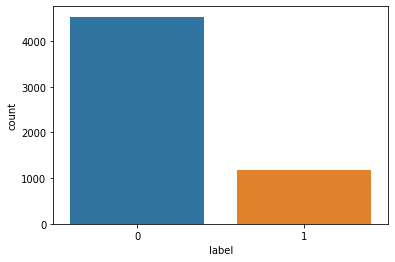

In [ ]:
label_2011_11 = generate_label(data, '2011-11')['label']

sns.countplot(label_2011_11)
label_2011_11.value_counts()

## create base data set

In [ ]:
train, test, y, features = feature_engineering1(data, '2011-12')

categorical feature: []
x_tr.shape (5722, 24) , x_te.shape (5914, 24)


In [ ]:
train_merge = train.merge(df_all,on=['customer_id','year_month','label'],how='left')

In [ ]:
print(len(train.columns))
print(len(df_all.columns))
print(len(train_merge.columns))

24
66
87


In [ ]:
test_merge = test.merge(df_all_test,on=['customer_id','year_month','label'],how='left')

print(len(test.columns))
print(len(df_all_test.columns))
print(len(test_merge.columns))

24
66
87


In [ ]:
print(len(train_merge.columns))

train_merge = train_merge.merge(df_all_nunique,on=['customer_id','year_month','label'],how='left')

print(len(df_all_nunique.columns))
print(len(train_merge.columns))

87
5
89


In [ ]:
print(len(test_merge.columns))

test_merge = test_merge.merge(df_all_nunique_test,on=['customer_id','year_month','label'],how='left')

print(len(df_all_nunique_test.columns))
print(len(test_merge.columns))

87
5
89


In [ ]:
print(len(train_merge.columns))

train_merge = train_merge.merge(df_all_mode,on=['customer_id','year_month','label'],how='left')

print(len(df_all_mode.columns))
print(len(train_merge.columns))

89
5
91


In [ ]:
print(len(test_merge.columns))

test_merge = test_merge.merge(df_all_mode_test,on=['customer_id','year_month','label'],how='left')

print(len(df_all_mode_test.columns))
print(len(test_merge.columns))

89
5
91


In [ ]:
print(len(train_merge.columns))

train_merge = train_merge.merge(df_all_ts,on=['customer_id','year_month','label'],how='left')

print(len(df_all_ts.columns))
print(len(train_merge.columns))

91
33
121


In [ ]:
print(len(test_merge.columns))

test_merge = test_merge.merge(df_all_ts_test,on=['customer_id','year_month','label'],how='left')

print(len(df_all_ts_test.columns))
print(len(test_merge.columns))

91
33
121


In [ ]:
total_features = train_merge.drop(columns=['customer_id', 'label', 'year_month']).columns

In [ ]:
len(total_features)

118

In [ ]:
train,test = feature_preprocessing(train_merge,test_merge,total_features,do_imputing=False)

categorical feature: ['year_month-mode']


In [ ]:
train.isna().sum()

customer_id                          0
year_month                           0
label                                0
quantity-mean                        0
quantity-max                         0
quantity-min                         0
quantity-sum                         0
quantity-count                       0
quantity-std                         0
quantity-skew                        0
price-mean                           0
price-max                            0
price-min                            0
price-sum                            0
price-count                          0
price-std                            0
price-skew                           0
total-mean                           0
total-max                            0
total-min                            0
total-sum                            0
total-count                          0
total-std                            0
total-skew                           0
cumsum_total_by_cust_id-mean         0
cumsum_total_by_cust_id-m

## country feature 생성

In [ ]:
data_country = data.copy()

data_country = data_country.drop_duplicates(['customer_id'])[['customer_id','country']].sort_values(['customer_id']).reset_index(drop=True)

le = LabelEncoder()
            
le.fit(list(data_country['country'].values))
            
data_country['country'] = le.transform(list(data_country['country'].values))

train_country = train.merge(data_country,on=['customer_id'],how='left')
test_country = test.merge(data_country,on=['customer_id'],how='left')

total_features = train_country.drop(columns=['customer_id','year_month','label']).columns

## drop feature

In [ ]:
train['quantity-count'].head(5)

0     47.0
1    211.0
2     51.0
3    107.0
4     17.0
Name: quantity-count, dtype: float64

In [ ]:
train['price-count'].head(5)

0     47.0
1    211.0
2     51.0
3    107.0
4     17.0
Name: price-count, dtype: float64

In [ ]:
train['total-count'].head(5)

0     47.0
1    211.0
2     51.0
3    107.0
4     17.0
Name: total-count, dtype: float64

In [ ]:
count_features = []

for i in total_features:
    if i.endswith('count'):
        count_features.append(i)

In [ ]:
count_features

['quantity-count',
 'price-count',
 'total-count',
 'cumsum_total_by_cust_id-count',
 'cumsum_quantity_by_cust_id-count',
 'cumsum_price_by_cust_id-count',
 'cumsum_total_by_prod_id-count',
 'cumsum_quantity_by_prod_id-count',
 'cumsum_price_by_prod_id-count',
 'cumsum_total_by_order_id-count',
 'cumsum_quantity_by_order_id-count',
 'cumsum_price_by_order_id-count',
 'order_ts_diff-count',
 'quantity_diff-count',
 'price_diff-count',
 'total_diff-count']

In [ ]:
for a,b in zip(count_features,count_features[1:]):
    c = (train[a] == train[b]).sum()
    if c != 5722:
        print(a)
        print(b)
        print(c)
        break

cumsum_price_by_order_id-count
order_ts_diff-count
0


In [ ]:
for a,b in zip(count_features,count_features[1:]):
    c = (test[a] == test[b]).sum()
    if c != 5914:
        print(a)
        print(b)
        print(c)
        break
        

cumsum_price_by_order_id-count
order_ts_diff-count
0


In [ ]:
train_drop = train_country.drop(columns=count_features[1:12])
test_drop = test_country.drop(columns=count_features[1:12])

In [ ]:
train_drop = train_drop.drop(columns = count_features[13:])
test_drop = test_drop.drop(columns = count_features[13:])

In [ ]:
drop_features = train_drop.drop(columns=['customer_id', 'label', 'year_month']).columns
print(len(drop_features))

105


In [ ]:
drop_features

Index(['quantity-mean', 'quantity-max', 'quantity-min', 'quantity-sum',
       'quantity-count', 'quantity-std', 'quantity-skew', 'price-mean',
       'price-max', 'price-min',
       ...
       'price_diff-sum', 'price_diff-std', 'price_diff-skew',
       'total_diff-mean', 'total_diff-max', 'total_diff-min', 'total_diff-sum',
       'total_diff-std', 'total_diff-skew', 'country'],
      dtype='object', length=105)

## lgb optuna optimization

In [ ]:
def objective(trial, label=label_2011_11):
    lgb_params = {
        'objective': 'binary', # 이진 분류
        'boosting_type': 'gbdt',
        'learning_rate':trial.suggest_uniform('leanrning_rate',0.01,0.3),
        'num_leaves': trial.suggest_int('num_leaves', 2, 256), # num_leaves 값을 2-256까지 정수값 중에 사용
        'max_bin': trial.suggest_int('max_bin', 128, 256), # max_bin 값을 128-256까지 정수값 중에 사용
        # min_data_in_leaf 값을 10-40까지 정수값 중에 사용
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 10, 40),
        # 피처 샘플링 비율을 0.4-1.0까지 중에 uniform 분포로 사용
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
        # 데이터 샘플링 비율을 0.4-1.0까지 중에 uniform 분포로 사용
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
        # 데이터 샘플링 횟수를 1-7까지 정수값 중에 사용
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 7),
        'n_estimators': 10000, # 트리 개수
        'early_stopping_rounds': 100,
        # L1 값을 1e-8-10.0까지 로그 uniform 분포로 사용
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        # L2 값을 1e-8-10.0까지 로그 uniform 분포로 사용
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        'seed': trial.suggest_int('seed',1,120),
        'verbose': -1,
        'n_jobs': -1,    
    }
    
    # oof prediction 함수 호출해서 out of fold validation 예측값을 얻어옴
    y_oof, test_preds, fi = make_lgb_oof_prediction(train_drop, y, test_drop, drop_features, model_params=lgb_params)
    
    # Validation 스코어 계산
    val_auc = roc_auc_score(label, y_oof)
    
    return val_auc

In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=5) # 5회 동안 하이퍼 파라미터 탐색

## light gbm best parameter

In [ ]:
model_params = {
    'objective': 'binary', # 이진 분류
    'boosting_type': 'gbdt',
    #'metric': 'auc', # 평가 지표 설정
    'feature_fraction': 0.9423481325176257, # 피처 샘플링 비율
    'bagging_fraction': 0.8482358514505766, # 데이터 샘플링 비율
    'bagging_freq': 7,
    'learning_rate':0.013699888580520174,
    #'max_depth':5,
    'max_bin':192,
    'num_leaves':99,
    'min_data_in_leaf':36,
    #'reg_alpha':0.5,
    #'reg_lambda':1.5,
    'lambda_l1':1.0727560324814671e-07,
    'lambda_l2':1.6580075169547936,
    'n_estimators': 10000, # 트리 개수
    'early_stopping_rounds': 100,
    'seed': 21,
    'verbose': -1,
    'n_jobs': -1,    
}

## light gbm prediction

In [ ]:
y_oof, test_preds, fi = make_lgb_oof_prediction(train_drop, y, test_drop, drop_features, model_params=model_params)

fold: 1, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
Training until validation scores don't improve for 100 rounds.
[200]	training's binary_logloss: 0.22846	valid_1's binary_logloss: 0.407063
Early stopping, best iteration is:
[239]	training's binary_logloss: 0.203262	valid_1's binary_logloss: 0.406317
Fold 1 | AUC: 0.8025950468293044
--------------------------------------------------------------------------------
fold: 2, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
Training until validation scores don't improve for 100 rounds.
[200]	training's binary_logloss: 0.229459	valid_1's binary_logloss: 0.380126
Early stopping, best iteration is:
[252]	training's binary_logloss: 0.196543	valid_1's binary_logloss: 0.378865
Fold 2 | AUC: 0.8260652278532559
--------------------------------------------------------------------------------
fold: 3, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
Training until validation scores don't improve for 100 rounds.
[200]	training's binary_logloss:

## xgb optuna hyperparameter tuning prediction

In [ ]:
def objective(trial, label=label_2011_11):
    model_params_xgb = {
        'objective': 'binary:logistic', # 이진 분류
        'eta': trial.suggest_uniform('eta',0.01,0.3),
        'gamma':trial.suggest_loguniform('gamma', 1e-8, 10.0),
        'lambda':trial.suggest_loguniform('lambda', 1e-8, 10.0),
        'alpha':trial.suggest_loguniform('alpha', 1e-8, 10.0),
        'max_depth':trial.suggest_int('max_depth',3,9),
        'eval_metric': 'auc', # 평가 지표 설정
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.4, 1.0),
        'subsample': trial.suggest_uniform('subsample',0.4,1.0), # 데이터 샘플링 비율
        'seed': trial.suggest_int('seed',1,120),
        'n_jobs': -1,
    }
        
    
    # oof prediction 함수 호출해서 out of fold validation 예측값을 얻어옴
    y_oof, test_preds, fi = make_xgb_oof_prediction(train_drop, y, test_drop, drop_features, model_params=model_params_xgb)
    
    # Validation 스코어 계산
    val_auc = roc_auc_score(label, y_oof)
    
    return val_auc

In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=5) # 5회 동안 하이퍼 파라미터 탐색

## xgboost best parameter

In [ ]:
model_params_xgb = {
    'objective': 'binary:logistic', # 이진 분류
    'eta': 0.04342052562188811,
    'gamma':4.212306342493176e-05,
    'lambda':0.00424961656361652,
    'alpha':0.0011157632907631014,
    'max_depth':4,
    'eval_metric': 'auc', # 평가 지표 설정
    'colsample_bytree': 0.7548725585793963, # 피처 샘플링 비율
    'subsample': 0.5603160690957429, # 데이터 샘플링 비율
    'seed': 78,
    'n_jobs': -1,    
}

## xgboost prediction

In [ ]:
y_oof, test_preds2, fi = make_xgb_oof_prediction(train_drop, y, test_drop, drop_features, model_params=model_params_xgb)

fold: 1, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
[0]	train-auc:0.81224	eval-auc:0.798153
Multiple eval metrics have been passed: 'eval-auc' will be used for early stopping.

Will train until eval-auc hasn't improved in 100 rounds.
[200]	train-auc:0.950485	eval-auc:0.79756
Stopping. Best iteration:
[110]	train-auc:0.910727	eval-auc:0.806556

Fold 1 | AUC: 0.795098656202569
--------------------------------------------------------------------------------
fold: 2, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
[0]	train-auc:0.810474	eval-auc:0.76589
Multiple eval metrics have been passed: 'eval-auc' will be used for early stopping.

Will train until eval-auc hasn't improved in 100 rounds.
Stopping. Best iteration:
[71]	train-auc:0.888222	eval-auc:0.833691

Fold 2 | AUC: 0.8333950320216192
--------------------------------------------------------------------------------
fold: 3, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
[0]	train-auc:0.81564	eval-auc:0.766716
Multiple eval 

## catboost optuna prediction

In [ ]:
def objective(trial, label=label_2011_11):
    model_params_cbt = {
        'eta':trial.suggest_uniform('eta',0.01,0.3),
        'iterations':10000,
        'loss_function':'Logloss',
        'eval_metric':'AUC',
        'rsm':trial.suggest_uniform('rsm',0.40,1.0),
        'subsample': trial.suggest_uniform('subsample',0.40,1.0), # 데이터 샘플링 비율
        'od_wait': 100,
        'l2_leaf_reg':trial.suggest_loguniform('l2_leaf_reg',1e-8,10.0),
        'depth':trial.suggest_int('depth',3,9),
        'random_seed':trial.suggest_int('random_seed',1,120),
        'verbose':-1,
        'thread_count':-1
    }
        
    
    # oof prediction 함수 호출해서 out of fold validation 예측값을 얻어옴
    y_oof, test_preds, fi = make_cbt_oof_prediction(train_drop, y, test_drop, drop_features, model_params=model_params_cbt)
    
    # Validation 스코어 계산
    val_auc = roc_auc_score(label, y_oof)
    
    return val_auc

In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=5) # 5회 동안 하이퍼 파라미터 탐색

## catboost best parameter

In [ ]:
model_params_cbt = {
    'eta':0.1302113423643965,
    'iterations':10000,
    'loss_function':'Logloss',
    'eval_metric':'AUC',
    'rsm':0.599430486637327,
    'subsample': 0.4051042958542255, # 데이터 샘플링 비율
    'od_wait': 100,
    'l2_leaf_reg':7.581004420021479e-05,
    'depth':4,
    'random_seed':100,
    'verbose':-1,
    'thread_count':-1
}

## catboost prediction

In [ ]:
y_oof, test_preds3, fi = make_cbt_oof_prediction(train_drop, y, test_drop, drop_features, model_params = model_params_cbt)

fold: 1, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
0:	test: 0.7442990	best: 0.7442990 (0)	total: 58.5ms	remaining: 9m 45s
1:	test: 0.7563580	best: 0.7563580 (1)	total: 69ms	remaining: 5m 44s
2:	test: 0.7604764	best: 0.7604764 (2)	total: 82.3ms	remaining: 4m 34s
3:	test: 0.7626143	best: 0.7626143 (3)	total: 92.6ms	remaining: 3m 51s
4:	test: 0.7642061	best: 0.7642061 (4)	total: 101ms	remaining: 3m 21s
5:	test: 0.7661959	best: 0.7661959 (5)	total: 110ms	remaining: 3m 3s
6:	test: 0.7661589	best: 0.7661959 (5)	total: 119ms	remaining: 2m 49s
7:	test: 0.7659830	best: 0.7661959 (5)	total: 126ms	remaining: 2m 37s
8:	test: 0.7656406	best: 0.7661959 (5)	total: 137ms	remaining: 2m 32s
9:	test: 0.7722948	best: 0.7722948 (9)	total: 146ms	remaining: 2m 26s
10:	test: 0.7757469	best: 0.7757469 (10)	total: 155ms	remaining: 2m 21s
11:	test: 0.7749880	best: 0.7757469 (10)	total: 164ms	remaining: 2m 16s
12:	test: 0.7774497	best: 0.7774497 (12)	total: 174ms	remaining: 2m 13s
13:	test: 0.7794580	best:

## stratified k-fold tabnet

In [ ]:
#tabnet hyperparameter

model_params_tab = {
    'n_d': 8,
    'n_a': 47,
    'n_steps':4,
    'n_independent':2,
    'n_shared':3,
    'momentum':0.24296746469311598,
    'seed': 7,
}

In [ ]:
def make_tab_oof_prediction(train, y, test, features, categorical_features='auto', model_params=None, folds=10):
    x_train = train[features]
    x_test = test[features]
    
    # 테스트 데이터 예측값을 저장할 변수
    test_preds = np.zeros(x_test.shape[0])
    
    # Out Of Fold Validation 예측 데이터를 저장할 변수
    y_oof = np.zeros(x_train.shape[0])
    
    # 폴드별 평균 Validation 스코어를 저장할 변수
    score = 0
    
    # 피처 중요도를 저장할 데이터 프레임 선언
    fi = pd.DataFrame()
    fi['feature'] = features
    
    # Stratified K Fold 선언
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=SEED)

    for fold, (tr_idx, val_idx) in enumerate(skf.split(x_train, y)):
        # train index, validation index로 train 데이터를 나눔
        x_tr, x_val = x_train.loc[tr_idx, features], x_train.loc[val_idx, features]
        y_tr, y_val = y[tr_idx], y[val_idx]
        
        print(f'fold: {fold+1}, x_tr.shape: {x_tr.shape}, x_val.shape: {x_val.shape}')
        
        # tabnet 모델 훈련
        clf = TabNetClassifier(
            **model_params,
            optimizer_fn=torch.optim.Adam,
            optimizer_params=dict(lr=2e-2),
            scheduler_params={"step_size":10, # how to use learning rate scheduler
                              "gamma":0.9},
            scheduler_fn=torch.optim.lr_scheduler.StepLR,
            mask_type='sparsemax' # This will be overwritten if using pretrain model
        )

        clf.fit(
            X_train=x_tr.values, y_train=y_tr.values,
            eval_set=[(x_tr.values, y_tr.values) , (x_val.values, y_val.values)],
            eval_name=['train' , 'valid'], 
            eval_metric=['auc'],
        )
        
        # Validation 데이터 예측
        val_preds = clf.predict_proba(x_val.values)
        
        # Validation index에 예측값 저장 
        y_oof[val_idx] = val_preds[:,1]
        
        # 폴드별 Validation 스코어 측정
        print(f"Fold {fold + 1} | AUC: {roc_auc_score(y_val, val_preds[:,1])}")
        print('-'*80)

        # score 변수에 폴드별 평균 Validation 스코어 저장
        score += roc_auc_score(y_val, val_preds[:,1]) / folds
        
        # 테스트 데이터 예측하고 평균해서 저장
        test_preds += clf.predict_proba(x_test.values)[:,1] / folds
        
        # 폴드별 피처 중요도 저장
        fi[f'fold_{fold+1}'] = clf.feature_importances_

        del x_tr, x_val, y_tr, y_val
        gc.collect()
        
    print(f"\nMean AUC = {score}") # 폴드별 Validation 스코어 출력
    print(f"OOF AUC = {roc_auc_score(y, y_oof)}") # Out Of Fold Validation 스코어 출력
        
    # 폴드별 피처 중요도 평균값 계산해서 저장 
    fi_cols = [col for col in fi.columns if 'fold_' in col]
    fi['importance'] = fi[fi_cols].mean(axis=1)
    
    return y_oof, test_preds, fi

## optuna tabnet hyperparameter tuning

In [ ]:
def objective(trial, label=label_2011_11):
    model_params_tab = {
        'n_d': trial.suggest_int('n_d',8,64),
        'n_a': trial.suggest_int('n_a',8,64),
        'n_steps':trial.suggest_int('n_steps',3,10),
        'n_independent':trial.suggest_int('n_independent', 1, 5),
        'n_shared':trial.suggest_int('n_shared', 1, 5),
        'momentum':trial.suggest_uniform('momentum',0.01,0.4),
        'seed': trial.suggest_int('seed',0,120),
    }
        
    
    # oof prediction 함수 호출해서 out of fold validation 예측값을 얻어옴
    y_oof, test_preds, fi = make_tab_oof_prediction(train_drop, y, test_drop, drop_features, model_params=model_params_tab)
    
    # Validation 스코어 계산
    val_auc = roc_auc_score(label, y_oof)
    
    return val_auc

In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=5) # 5회 동안 하이퍼 파라미터 탐색

## tabnet best parameter

In [ ]:
#tabnet hyperparameter

model_params_tab = {
    'n_d': 21,
    'n_a': 31,
    'n_steps':3,
    'n_independent':1,
    'n_shared':1,
    'momentum':0.031239494321028342,
    'seed': 71,
}

## tabnet prediction

In [ ]:
y_oof, test_preds4, fi = make_tab_oof_prediction(train_drop, y, test_drop, drop_features, model_params = model_params_tab)

fold: 1, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
Device used : cuda
epoch 0  | loss: 0.68487 | train_auc: 0.43083 | valid_auc: 0.43803 |  0:00:00s
epoch 1  | loss: 0.54132 | train_auc: 0.50713 | valid_auc: 0.51022 |  0:00:00s
epoch 2  | loss: 0.49931 | train_auc: 0.54902 | valid_auc: 0.55755 |  0:00:00s
epoch 3  | loss: 0.48179 | train_auc: 0.59767 | valid_auc: 0.5737  |  0:00:00s
epoch 4  | loss: 0.4633  | train_auc: 0.65463 | valid_auc: 0.65877 |  0:00:01s
epoch 5  | loss: 0.44461 | train_auc: 0.61176 | valid_auc: 0.59218 |  0:00:01s
epoch 6  | loss: 0.44259 | train_auc: 0.52753 | valid_auc: 0.50815 |  0:00:01s
epoch 7  | loss: 0.43586 | train_auc: 0.5262  | valid_auc: 0.54698 |  0:00:01s
epoch 8  | loss: 0.43988 | train_auc: 0.67985 | valid_auc: 0.68632 |  0:00:01s
epoch 9  | loss: 0.42576 | train_auc: 0.63272 | valid_auc: 0.60114 |  0:00:02s
epoch 10 | loss: 0.42112 | train_auc: 0.65509 | valid_auc: 0.63662 |  0:00:02s
epoch 11 | loss: 0.42694 | train_auc: 0.66709 | valid_

## MLP training

In [ ]:
model_params_tabular = {
    'mlp_hidden_sizes':(512, 256, 128, 64),
    'mlp_activation':nn.LeakyReLU,
    'mlp_use_bn':True,
    'mlp_ghost_batch' :2048, ##using ghost batch normalization
    'mlp_dropout':0.0,
    'mlp_use_skip':True,
    'use_leaky_gate':True,
    'seed':SEED
    }
  
fit_params_tabular = {
    'num_epochs':100,
    'batch_size':2048,
    'early_stopping_patience':10,
    'opt_kwargs':{"lr": 1e-2},
    'sch_kwargs':{"step_size": 5, "gamma": 0.1 ** 0.125},
}

In [ ]:
def make_mlp_oof_prediction(train, y, test, features, categorical_features,model_params=None, fit_params=None, folds=10):
    x_train = train[features]
    x_test = test[features]
    
    # 테스트 데이터 예측값을 저장할 변수
    test_preds = torch.zeros(x_test.shape[0])
    
    # Out Of Fold Validation 예측 데이터를 저장할 변수
    y_oof = np.zeros(x_train.shape[0])
    
    # 폴드별 평균 Validation 스코어를 저장할 변수
    score = 0
    
    # Stratified K Fold 선언
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=SEED)

    for fold, (tr_idx, val_idx) in enumerate(skf.split(x_train.values, y.values)):
        # train index, validation index로 train 데이터를 나눔
        x_tr, x_val = x_train.loc[tr_idx, features], x_train.loc[val_idx, features]
        y_tr, y_val = y[tr_idx], y[val_idx]
        
        print(f'fold: {fold+1}, x_tr.shape: {x_tr.shape}, x_val.shape: {x_val.shape}')
        
        # tabnet 모델 훈련
        clf = MLPClassifier(
            **model_params
        )

        clf.fit(
            **fit_params,
            X_num=x_tr[x_tr.columns.difference(categorical_features)].values,
            X_cat=x_tr[categorical_features].values,
            y=y_tr.values,
            optimizer=torch.optim.Adam,
            scheduler=torch.optim.lr_scheduler.StepLR,
            val_sets=[[x_val[x_val.columns.difference(categorical_features)].values, x_val[categorical_features].values, y_val.values]],
            extra_metrics=[("accuracy", accuracy)],
            early_stopping_metric="accuracy",
            early_stopping_mode="max",
            verbose=True,
        )
        
        # Validation 데이터 예측
        val_preds = clf.predict_proba(X_num=x_val[x_val.columns.difference(categorical_features)].values,X_cat=torch.from_numpy(x_val[categorical_features].values))
        
        # Validation index에 예측값 저장 
        y_oof[val_idx] = val_preds[:,1]
        
        # 폴드별 Validation 스코어 측정
        print(f"Fold {fold + 1} | AUC: {roc_auc_score(y_val, val_preds[:,1])}")
        print('-'*80)

        # score 변수에 폴드별 평균 Validation 스코어 저장
        score += roc_auc_score(y_val, val_preds[:,1]) / folds
        
        # 테스트 데이터 예측하고 평균해서 저장
        test_preds += clf.predict_proba(x_test[x_test.columns.difference(categorical_features)].values,torch.from_numpy(x_test[categorical_features].values))[:,1] / folds

        del x_tr, x_val, y_tr, y_val
        gc.collect()
        
    print(f"\nMean AUC = {score}") # 폴드별 Validation 스코어 출력
    print(f"OOF AUC = {roc_auc_score(y, y_oof)}") # Out Of Fold Validation 스코어 출력
    
    return y_oof, test_preds

In [ ]:
y_oof, test_preds5 = make_mlp_oof_prediction(train_drop, y, test_drop, drop_features, categorical_features=['country'], model_params = model_params_tabular,fit_params=fit_params_tabular)

fold: 1, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   2.475e+06  2.648e+06      79.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   2.325e+06  1.754e+06      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   6.190e+05  3.366e+04      75.39


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.47   1.449e+06  3.129e+04      78.36


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   5.250e+05  6.960e+05      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   5.711e+05  5.288e+05      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.46   2.190e+05  4.798e+04      81.33


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   4.386e+05  6.975e+04      80.45


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   2.494e+05  3.124e+05      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   2.364e+05  1.702e+05      80.10


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.45   5.797e+04  2.321e+05      21.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.45   7.058e+04  1.080e+05      80.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.45   1.325e+05  1.290e+05      80.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.45   5.405e+04  5.860e+04      76.44


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.45   5.500e+04  6.464e+04      80.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.45   8.661e+04  8.454e+04      80.10


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.45   6.488e+04  4.781e+04      80.98


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.45   6.196e+04  4.602e+04      77.49
Stopping early. Best epoch: 6. Best accuracy:     81.3264
Fold 1 | AUC: 0.7122126383593086
--------------------------------------------------------------------------------
fold: 2, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   3.907e+06  3.781e+06      79.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   2.626e+06  1.755e+06      79.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   7.471e+04  1.890e+06      20.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.47   9.290e+04  3.686e+05      80.28


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   6.528e+05  5.615e+05      80.28


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   4.204e+05  1.892e+05      82.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.46   3.936e+05  1.869e+05      53.75


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   1.260e+05  1.976e+05      82.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   2.195e+05  1.726e+05      82.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   7.969e+04  1.328e+05      62.83


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   1.126e+05  7.494e+04      76.79


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   1.074e+05  1.067e+05      83.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.46   8.176e+04  5.976e+04      81.15


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.45   8.250e+04  6.646e+04      69.28


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.45   4.644e+04  5.486e+04      83.60


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.45   5.417e+04  3.573e+04      82.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.45   4.357e+04  2.930e+04      74.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.45   3.118e+04  3.191e+04      83.25


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.45   1.957e+04  3.529e+04      45.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.45   3.715e+04  3.879e+04      82.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.45   2.354e+04  4.260e+04      40.14


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.45   1.987e+04  2.150e+04      83.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.45   2.067e+04  1.359e+04      83.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.45   1.486e+04  1.530e+04      52.71


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.45   2.326e+04  1.273e+04      83.60


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   25   0.00237     0.45   1.849e+04  1.679e+04      83.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   26   0.00237     0.45   2.847e+04  1.803e+04      82.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   27   0.00237     0.45   4.539e+04  1.472e+04      82.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   28   0.00237     0.45   3.529e+04  2.953e+04      82.02


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   29   0.00237     0.45   2.674e+04  1.708e+04      81.50


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   30   0.00178     0.45   1.820e+04  2.099e+04      82.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   31   0.00178     0.45   1.550e+04  1.981e+04      67.54


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   32   0.00178     0.45   1.270e+04  2.251e+04      82.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   33   0.00178     0.45       9551.  1.653e+04      71.55
Stopping early. Best epoch: 22. Best accuracy:     83.7696
Fold 2 | AUC: 0.6898807981342316
--------------------------------------------------------------------------------
fold: 3, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   3.782e+06  3.765e+06      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   2.421e+06  1.784e+06      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   6.069e+04  2.071e+06      20.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.47   4.798e+04  3.997e+05      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   7.689e+05  7.731e+05      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   5.954e+05  4.401e+05      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.46   8.705e+04  4.161e+05      20.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   7.224e+04  1.516e+05      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   2.676e+05  3.057e+05      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   2.309e+05  1.619e+05      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   1.046e+05  1.139e+05      69.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.45   1.462e+05  9.017e+04      72.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.45   9.213e+04  1.069e+05      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.45   1.143e+05  8.825e+04      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.45   7.227e+04  6.511e+04      71.15


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.45   7.744e+04  4.411e+04      78.50


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.45   6.380e+04  5.967e+04      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.45   4.486e+04  3.262e+04      82.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.45   5.078e+04  3.209e+04      70.45


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.45   3.214e+04  3.106e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.45   2.415e+04  1.755e+04      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.45   2.190e+04  2.285e+04      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.45   2.249e+04  1.371e+04      82.34


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.45   1.538e+04  2.406e+04      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.45   2.642e+04  1.113e+04      59.62


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   25   0.00237     0.45   1.119e+04      9884.      75.70


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   26   0.00237     0.45   1.348e+04      9652.      58.74


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   27   0.00237     0.45   1.681e+04  1.331e+04      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   28   0.00237     0.45   2.103e+04  1.428e+04      81.29
Stopping early. Best epoch: 17. Best accuracy:     82.6923
Fold 3 | AUC: 0.5748338684387366
--------------------------------------------------------------------------------
fold: 4, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   1.443e+06  4.868e+05      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   1.423e+06  1.432e+06      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   1.392e+06  1.151e+06      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.48   7.929e+05  4.266e+05      80.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   7.862e+05  5.246e+05      20.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   1.038e+05  1.539e+05      83.57


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.46   2.110e+05  1.973e+05      83.22


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   2.101e+05  1.344e+05      83.57


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   1.092e+05  9.827e+04      72.38


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   1.295e+05  1.141e+05      68.53


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   8.575e+04  6.943e+04      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   8.601e+04  6.977e+04      82.87


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.46   7.196e+04  6.116e+04      83.04


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.45   5.920e+04  4.483e+04      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.45   4.480e+04  4.188e+04      72.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.45   4.189e+04  3.550e+04      73.25


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.45   2.731e+04  2.566e+04      80.77
Stopping early. Best epoch: 5. Best accuracy:     83.5664
Fold 4 | AUC: 0.678152766370492
--------------------------------------------------------------------------------
fold: 5, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   2.661e+06  2.661e+06      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   2.322e+06  1.756e+06      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   5.806e+05  4.281e+04      69.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.47   1.322e+06  4.091e+04      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   4.719e+05  5.615e+05      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   4.132e+05  3.433e+05      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.46   5.193e+04  4.773e+05      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   9.060e+04  2.083e+05      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   3.340e+05  2.860e+05      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   1.722e+05  8.857e+04      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   1.828e+05  9.018e+04      66.08


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.45   9.187e+04  1.179e+05      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.45   9.838e+04  9.308e+04      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.45   6.488e+04  1.021e+05      58.92


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.45   6.117e+04  6.685e+04      79.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.45   7.331e+04  7.102e+04      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.45   4.606e+04  5.530e+04      72.03


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.45   6.052e+04  4.653e+04      76.57


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.45   4.818e+04  4.855e+04      79.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.45   3.650e+04  3.854e+04      72.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.45   3.310e+04  3.295e+04      76.92


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.45   3.031e+04  3.250e+04      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.45   2.378e+04  2.930e+04      73.43
Stopping early. Best epoch: 11. Best accuracy:     81.4685
Fold 5 | AUC: 0.6742352570167139
--------------------------------------------------------------------------------
fold: 6, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   1.301e+06  5.395e+05      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   1.438e+06  1.507e+06      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   1.426e+06  1.216e+06      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.48   7.793e+05  4.461e+05      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   8.636e+05  5.573e+05      20.98


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   1.110e+05  1.674e+05      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.46   2.188e+05  2.195e+05      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   1.996e+05  1.542e+05      82.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   9.162e+04  9.708e+04      78.15


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   1.471e+05  1.204e+05      69.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   9.252e+04  7.739e+04      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   7.837e+04  7.684e+04      82.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.46   7.970e+04  6.785e+04      82.87


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.45   5.219e+04  5.130e+04      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.45   4.455e+04  4.647e+04      77.10


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.45   4.190e+04  4.014e+04      76.92


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.45   3.338e+04  3.028e+04      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.45   3.658e+04  2.653e+04      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.45   2.186e+04  1.980e+04      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.45   1.785e+04  1.603e+04      76.92


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.45   1.128e+04  1.070e+04      80.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.45       9073.      7428.      82.52


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.45       5375.      7640.      47.03


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.45       7792.      7494.      80.24
Stopping early. Best epoch: 12. Best accuracy:     82.8671
Fold 6 | AUC: 0.5592872910753706
--------------------------------------------------------------------------------
fold: 7, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   1.314e+06  5.359e+05      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   1.351e+06  1.500e+06      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   1.507e+06  1.220e+06      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.48   7.482e+05  4.422e+05      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   8.544e+05  5.759e+05      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   1.257e+05  1.799e+05      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.46   2.145e+05  2.342e+05      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   1.662e+05  1.648e+05      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   8.591e+04  1.143e+05      76.05


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   1.300e+05  1.208e+05      71.68


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   8.178e+04  8.750e+04      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   7.503e+04  8.957e+04      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.45   7.641e+04  7.747e+04      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.45   6.907e+04  5.814e+04      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.45   6.455e+04  5.607e+04      75.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.45   4.956e+04  4.490e+04      76.92


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.45   3.196e+04  3.630e+04      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.45   3.087e+04  3.263e+04      80.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.45   3.107e+04  2.377e+04      81.12
Stopping early. Best epoch: 7. Best accuracy:     81.6434
Fold 7 | AUC: 0.6732335318233253
--------------------------------------------------------------------------------
fold: 8, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   1.344e+06  5.213e+05      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   1.479e+06  1.489e+06      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   1.332e+06  1.203e+06      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.48   6.979e+05  4.303e+05      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   8.371e+05  5.936e+05      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   9.765e+04  1.541e+05      82.34


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.46   2.361e+05  2.042e+05      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   2.202e+05  1.463e+05      82.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   1.147e+05  9.868e+04      74.48


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   1.246e+05  1.240e+05      66.96


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   1.003e+05  7.511e+04      79.02


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   8.675e+04  7.419e+04      83.22


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.46   8.719e+04  6.684e+04      83.04


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.45   7.145e+04  4.938e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.45   4.174e+04  4.651e+04      73.78


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.45   4.786e+04  4.003e+04      73.95


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.45   3.440e+04  2.894e+04      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.45   2.918e+04  2.599e+04      82.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.45   2.876e+04  1.886e+04      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.45   1.624e+04  1.523e+04      75.87


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.45   1.218e+04      9902.      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.45       8240.      7312.      83.04


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.45       4500.  1.194e+04      50.00
Stopping early. Best epoch: 11. Best accuracy:     83.2168
Fold 8 | AUC: 0.5820950896915058
--------------------------------------------------------------------------------
fold: 9, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   2.411e+06  2.679e+06      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   2.425e+06  1.789e+06      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   5.550e+05  3.409e+04      76.40


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.47   1.574e+06  6.262e+04      58.57


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   7.710e+05  9.440e+05      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   9.540e+05  8.712e+05      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.46   5.762e+05  3.716e+05      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   9.531e+04  1.440e+05      23.25


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   1.827e+05  1.992e+05      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.45   1.909e+05  1.341e+05      81.99


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.45   5.394e+04  8.990e+04      62.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.45   7.344e+04  8.549e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.45   1.496e+05  1.352e+05      81.99


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.45   1.250e+05  6.498e+04      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.45   1.118e+05  7.002e+04      68.18


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.45   4.694e+04  6.466e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.45   7.123e+04  6.034e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.45   4.786e+04  4.556e+04      74.30


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.45   4.765e+04  3.717e+04      79.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.45   3.676e+04  4.124e+04      81.99


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.45   3.517e+04  3.053e+04      78.50


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.45   4.882e+04  2.834e+04      77.62


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.45   2.741e+04  3.065e+04      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.45   3.520e+04  2.363e+04      78.50


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.45   2.354e+04  2.174e+04      78.85
Stopping early. Best epoch: 13. Best accuracy:     82.1678
Fold 9 | AUC: 0.6743743855157958
--------------------------------------------------------------------------------
fold: 10, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   4.048e+06  3.795e+06      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   2.693e+06  1.787e+06      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   9.475e+04  1.645e+06      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.47   1.610e+05  5.241e+05      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   7.430e+05  7.715e+05      79.02


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   5.143e+05  3.933e+05      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.46   1.287e+05  4.429e+05      20.98


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   9.304e+04  1.989e+05      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   1.978e+05  2.826e+05      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   1.080e+05  1.432e+05      71.50


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   1.359e+05  1.329e+05      75.70


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   1.051e+05  1.579e+05      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.45   8.549e+04  1.126e+05      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.45   7.904e+04  1.094e+05      70.45


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.45   5.435e+04  9.236e+04      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.45   5.260e+04  7.568e+04      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.45   4.400e+04  6.874e+04      71.15


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.45   3.350e+04  5.734e+04      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.45   2.832e+04  4.489e+04      79.72
Stopping early. Best epoch: 7. Best accuracy:     81.2937
Fold 10 | AUC: 0.6365221585322871
--------------------------------------------------------------------------------

Mean AUC = 0.6454827784957767
OOF AUC = 0.645596347239488


## optuna MLP hyperparameter tuning

In [95]:
def objective(trial, label=label_2011_11):

    model_params_tabular = {
    'mlp_hidden_sizes':(512, 256, 128, 64),
    'mlp_activation':nn.LeakyReLU,
    'mlp_use_bn':True,
    'mlp_ghost_batch' : trial.suggest_categorical('mlp_ghost_batch',[8,16,32,64,128,256,512,1024,2048]), ##using ghost batch normalization
    'mlp_dropout':trial.suggest_uniform('mlp_dropout',0.0,0.9),
    'mlp_use_skip':True,
    'use_leaky_gate':True,
    'seed':trial.suggest_int('seed',0,120)
    }
  
    fit_params_tabular = {
        'num_epochs':trial.suggest_int('num_epoch',80,150),
        'batch_size':model_params_tabular['mlp_ghost_batch'],
        'early_stopping_patience':trial.suggest_int('early_stopping_patience',8,20),
        'opt_kwargs':{"lr": trial.suggest_uniform('lr',1e-4,1e-1)},
        'sch_kwargs':{"step_size": 5, "gamma": 0.1 ** 0.125},
    }
        
    
    # oof prediction 함수 호출해서 out of fold validation 예측값을 얻어옴
    y_oof, test_preds5 = make_mlp_oof_prediction(train_drop, y, test_drop, drop_features, categorical_features=['country'], model_params = model_params_tabular,fit_params=fit_params_tabular)
    
    # Validation 스코어 계산
    val_auc = roc_auc_score(label, y_oof)
    
    return val_auc

In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=5) # 5회 동안 하이퍼 파라미터 탐색

## AutoInt training

In [ ]:
model_params_tabular = {
    'mlp_hidden_sizes':(512, 256, 128, 64),
    'mlp_activation':nn.LeakyReLU,
    'mlp_use_bn':True,
    'mlp_ghost_batch' :2048, ##using ghost batch normalization
    'mlp_dropout':0.0,
    'mlp_use_skip':True,
    'use_leaky_gate':True,
    'seed':SEED
    }
  
fit_params_tabular = {
    'num_epochs':100,
    'batch_size':2048,
    'early_stopping_patience':10,
    'opt_kwargs':{"lr": 1e-2},
    'sch_kwargs':{"step_size": 5, "gamma": 0.1 ** 0.125},
}

In [ ]:
def make_autoint_oof_prediction(train, y, test, features, categorical_features,model_params=None, fit_params=None, folds=10):
    x_train = train[features]
    x_test = test[features]
    
    # 테스트 데이터 예측값을 저장할 변수
    test_preds = torch.zeros(x_test.shape[0])
    
    # Out Of Fold Validation 예측 데이터를 저장할 변수
    y_oof = np.zeros(x_train.shape[0])
    
    # 폴드별 평균 Validation 스코어를 저장할 변수
    score = 0
    
    # Stratified K Fold 선언
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=SEED)

    for fold, (tr_idx, val_idx) in enumerate(skf.split(x_train.values, y.values)):
        # train index, validation index로 train 데이터를 나눔
        x_tr, x_val = x_train.loc[tr_idx, features], x_train.loc[val_idx, features]
        y_tr, y_val = y[tr_idx], y[val_idx]
        
        print(f'fold: {fold+1}, x_tr.shape: {x_tr.shape}, x_val.shape: {x_val.shape}')
        
        # tabnet 모델 훈련
        clf = AutoIntClassifier(
            **model_params
        )

        clf.fit(
            **fit_params,
            X_num=x_tr[x_tr.columns.difference(categorical_features)].values,
            X_cat=x_tr[categorical_features].values,
            y=y_tr.values,
            optimizer=torch.optim.Adam,
            scheduler=torch.optim.lr_scheduler.StepLR,
            val_sets=[[x_val[x_val.columns.difference(categorical_features)].values, x_val[categorical_features].values, y_val.values]],
            extra_metrics=[("accuracy", accuracy)],
            early_stopping_metric="accuracy",
            early_stopping_mode="max",
            verbose=True,
        )
        
        # Validation 데이터 예측
        val_preds = clf.predict_proba(X_num=x_val[x_val.columns.difference(categorical_features)].values,X_cat=torch.from_numpy(x_val[categorical_features].values))
        
        # Validation index에 예측값 저장 
        y_oof[val_idx] = val_preds[:,1]
        
        # 폴드별 Validation 스코어 측정
        print(f"Fold {fold + 1} | AUC: {roc_auc_score(y_val, val_preds[:,1])}")
        print('-'*80)

        # score 변수에 폴드별 평균 Validation 스코어 저장
        score += roc_auc_score(y_val, val_preds[:,1]) / folds
        
        # 테스트 데이터 예측하고 평균해서 저장
        test_preds += clf.predict_proba(x_test[x_test.columns.difference(categorical_features)].values,torch.from_numpy(x_test[categorical_features].values))[:,1] / folds

        del x_tr, x_val, y_tr, y_val
        gc.collect()
        
    print(f"\nMean AUC = {score}") # 폴드별 Validation 스코어 출력
    print(f"OOF AUC = {roc_auc_score(y, y_oof)}") # Out Of Fold Validation 스코어 출력
    
    return y_oof, test_preds

In [ ]:
y_oof, test_preds6 = make_autoint_oof_prediction(train_drop, y, test_drop, drop_features, categorical_features=['country'], model_params = model_params_tabular,fit_params=fit_params_tabular)

fold: 1, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.51   1.169e+06  1.405e+06      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.52   1.026e+06  8.189e+05      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.52   1.541e+05  7.290e+05      20.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.53   3.714e+04  1.615e+05      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.53   2.850e+05  3.600e+05      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.54   3.607e+05  3.202e+05      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.54   2.188e+05  1.958e+05      79.76


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.54   9.461e+04  7.139e+04      80.28


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.55   4.510e+04  6.734e+04      59.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.55   7.899e+04  4.095e+04      80.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.55   6.037e+04  5.939e+04      79.93


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.55   4.125e+04  3.939e+04      70.16


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.55   3.316e+04  3.034e+04      80.98


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.55   3.365e+04  3.447e+04      80.10


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.55   2.421e+04  2.266e+04      80.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.55   1.910e+04  2.138e+04      75.57


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.55   2.033e+04  1.826e+04      81.68


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.55   2.140e+04  1.816e+04      80.98


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.55   1.446e+04  1.367e+04      80.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.55   1.456e+04  1.257e+04      71.38


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.55   1.294e+04  1.088e+04      81.15


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.55       8792.  1.059e+04      80.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.55       8277.      8637.      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.55       9506.      8101.      80.28


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.56   1.063e+04      7861.      80.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   25   0.00237     0.56       7302.      7162.      61.26


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   26   0.00237     0.56       5286.      6573.      79.93


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   27   0.00237     0.56       7688.      6011.      79.23
Stopping early. Best epoch: 16. Best accuracy:     81.6754
Fold 1 | AUC: 0.6426165179728279
--------------------------------------------------------------------------------
fold: 2, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.51   5.606e+05  6.569e+05      79.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.51   5.120e+05  3.486e+05      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.52   8.108e+04      6591.      80.45


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.52   1.788e+04      8658.      77.84


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.52   5.574e+04  8.619e+04      80.28


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.53   8.587e+04  4.930e+04      82.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.53   8.769e+04  1.625e+04      69.46


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.53   4.219e+04  4.076e+04      82.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.53   2.409e+04  1.341e+04      80.10


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.53   1.710e+04  3.133e+04      83.25


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.53   4.298e+04  3.223e+04      83.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.53   1.679e+04  2.625e+04      51.48


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.53   1.272e+04  1.865e+04      83.60


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.53   2.203e+04  1.731e+04      83.60


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.53   1.389e+04  1.640e+04      62.48


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.54   1.165e+04  1.403e+04      83.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.54   1.124e+04      8855.      81.68


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.54   1.307e+04      7256.      80.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.54   1.196e+04      9595.      83.25


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.54       8354.      7084.      67.54


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.54       9383.      8182.      83.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.54       5905.  1.151e+04      37.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.54   1.476e+04  1.474e+04      82.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.54       7563.      7287.      44.33
Stopping early. Best epoch: 12. Best accuracy:     83.5951
Fold 2 | AUC: 0.6269759004923555
--------------------------------------------------------------------------------
fold: 3, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.51   5.530e+05  6.502e+05      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.51   5.273e+05  3.551e+05      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.52   8.229e+04      7334.      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.52   2.189e+04  1.139e+04      82.87


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.52   4.219e+04  7.970e+04      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.53   8.067e+04  6.274e+04      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.53   1.376e+04  9.823e+04      20.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.53   2.847e+04  4.499e+04      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.53   4.992e+04  4.125e+04      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.53   1.591e+04  5.051e+04      21.68


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.53   2.193e+04  2.951e+04      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.53   3.264e+04  2.622e+04      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.53   1.511e+04  2.165e+04      53.15


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.53   1.736e+04  1.643e+04      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.54   1.560e+04  1.161e+04      82.52
Stopping early. Best epoch: 3. Best accuracy:     82.8671
Fold 3 | AUC: 0.6483984170835511
--------------------------------------------------------------------------------
fold: 4, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.51   1.937e+06  1.914e+06      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.51   1.603e+06  1.111e+06      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.52   4.559e+05  1.586e+05      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.53   5.343e+05  1.256e+05      20.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.53   2.362e+05  2.790e+05      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.54   3.173e+05  2.853e+05      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.54   2.180e+05  1.282e+05      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.54   9.888e+04  1.315e+05      26.57


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.54   4.747e+04  6.098e+04      83.92


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.54   8.414e+04  8.127e+04      83.22


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.55   7.961e+04  5.364e+04      83.92


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.55   4.034e+04  4.418e+04      72.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.55   6.798e+04  5.525e+04      66.96


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.55   3.715e+04  3.181e+04      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.55   4.294e+04  3.560e+04      83.57


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.55   3.384e+04  2.771e+04      83.04


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.55   2.781e+04  2.348e+04      74.83


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.55   2.767e+04  2.436e+04      72.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.55   2.519e+04  1.700e+04      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.55   1.990e+04  1.615e+04      83.04
Stopping early. Best epoch: 8. Best accuracy:     83.9161
Fold 4 | AUC: 0.6730008213245725
--------------------------------------------------------------------------------
fold: 5, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.51   1.374e+06  1.419e+06      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.51   1.017e+06  8.034e+05      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.52   1.507e+05  7.715e+05      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.53   8.717e+04  1.434e+05      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.53   3.080e+05  3.456e+05      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.54   3.085e+05  3.063e+05      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.54   2.145e+05  1.837e+05      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.54   1.004e+05  6.810e+04      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.55   5.400e+04  7.781e+04      54.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.55   5.550e+04  4.753e+04      73.08


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.55   4.534e+04  5.245e+04      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.55   3.233e+04  5.019e+04      60.66


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.55   2.692e+04  3.853e+04      79.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.55   4.183e+04  2.808e+04      77.45


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.55   2.627e+04  2.418e+04      77.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.55   3.204e+04  2.312e+04      79.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.55   1.649e+04  2.082e+04      71.68


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.55   1.307e+04  1.721e+04      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.55   1.261e+04  1.433e+04      78.15
Stopping early. Best epoch: 7. Best accuracy:     81.4685
Fold 5 | AUC: 0.645175951175172
--------------------------------------------------------------------------------
fold: 6, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.51   1.823e+06  1.919e+06      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.51   1.396e+06  1.125e+06      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.52   4.887e+05  1.781e+05      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.53   4.428e+05  5.394e+04      61.54


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.53   1.714e+05  1.945e+05      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.53   1.837e+05  1.609e+05      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.54   8.894e+04  4.118e+04      82.34


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.54   8.905e+04  4.808e+04      73.43


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.54   5.117e+04  5.922e+04      82.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.54   5.844e+04  4.717e+04      82.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.54   4.114e+04  3.484e+04      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.54   3.740e+04  4.042e+04      70.98


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.54   3.280e+04  2.699e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.55   2.721e+04  2.647e+04      83.04


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.55   1.991e+04  1.886e+04      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.55   1.674e+04  1.951e+04      72.38


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.55   1.361e+04  1.431e+04      82.34


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.55   1.383e+04  1.267e+04      83.04


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.55       9060.  1.555e+04      45.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.55   1.133e+04  1.202e+04      82.52


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.55       9223.      8025.      82.52


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.55       6049.      8183.      82.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.55       9266.      7798.      82.52


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.55   1.298e+04      5925.      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.55       8093.      6589.      82.87
Stopping early. Best epoch: 13. Best accuracy:      83.042
Fold 6 | AUC: 0.6563897082011613
--------------------------------------------------------------------------------
fold: 7, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.51   2.011e+06  1.901e+06      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.51   1.580e+06  1.104e+06      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.52   5.252e+05  1.557e+05      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.53   5.519e+05  1.547e+05      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.53   2.085e+05  2.703e+05      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.54   3.070e+05  2.836e+05      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.54   1.855e+05  1.436e+05      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.54   8.507e+04  1.315e+05      51.40


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.54   3.887e+04  6.582e+04      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.54   8.888e+04  8.688e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.55   7.119e+04  6.271e+04      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.55   5.075e+04  5.451e+04      75.70


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.55   5.085e+04  5.413e+04      72.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.55   3.672e+04  4.086e+04      81.99


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.55   3.258e+04  4.068e+04      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.55   3.313e+04  3.053e+04      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.55   2.504e+04  3.176e+04      73.08


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.55   2.815e+04  2.382e+04      77.10


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.55   2.298e+04  2.258e+04      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.55   1.638e+04  1.759e+04      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.55   1.287e+04  1.809e+04      71.68


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.55       8531.  1.404e+04      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.55   1.130e+04  1.295e+04      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.55       8461.  1.384e+04      50.00


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.55   1.008e+04  1.397e+04      81.29
Stopping early. Best epoch: 13. Best accuracy:      81.993
Fold 7 | AUC: 0.6030849425863061
--------------------------------------------------------------------------------
fold: 8, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.51   1.944e+06  1.911e+06      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.51   1.425e+06  1.112e+06      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.52   4.608e+05  1.675e+05      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.53   4.935e+05  8.086e+04      46.15


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.53   2.063e+05  2.204e+05      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.53   2.261e+05  2.029e+05      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.54   1.296e+05  7.085e+04      82.87


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.54   1.803e+05  8.804e+04      54.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.54   6.371e+04  6.543e+04      83.04


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.54   8.965e+04  7.353e+04      83.04


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.54   7.158e+04  4.941e+04      82.87


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.55   4.921e+04  4.272e+04      74.48


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.55   5.324e+04  4.959e+04      64.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.55   3.249e+04  3.039e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.55   4.071e+04  3.226e+04      82.87


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.55   3.156e+04  2.583e+04      82.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.55   2.275e+04  2.038e+04      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.55   2.504e+04  2.142e+04      72.73


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.55   1.432e+04  1.512e+04      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.55   1.824e+04  1.434e+04      82.52
Stopping early. Best epoch: 8. Best accuracy:      83.042
Fold 8 | AUC: 0.6727697701597194
--------------------------------------------------------------------------------
fold: 9, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.51   1.176e+06  1.441e+06      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.52   1.222e+06  8.455e+05      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.52   1.847e+05  7.422e+05      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.53   9.370e+04  1.477e+05      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.53   3.206e+05  3.501e+05      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.54   3.350e+05  3.089e+05      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.54   2.118e+05  1.845e+05      79.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.54   9.402e+04  5.877e+04      81.99


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.55   5.089e+04  5.877e+04      59.44


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.55   5.126e+04  3.030e+04      75.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.55   3.815e+04  4.220e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.55   2.499e+04  3.919e+04      59.79


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.55   2.301e+04  2.985e+04      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.55   2.676e+04  2.068e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.55   2.246e+04  2.189e+04      63.99


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.55   2.168e+04  1.399e+04      78.50


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.55   1.645e+04  1.421e+04      82.34


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.55   1.458e+04  1.494e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.55   1.264e+04  1.344e+04      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.55   1.347e+04  1.040e+04      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.55       7826.      8406.      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.55       8901.      8233.      72.73


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.55       9109.      7428.      74.65


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.55       7557.      6599.      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.55       6292.      6546.      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   25   0.00237     0.55       7567.      6043.      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   26   0.00237     0.55       5956.      5303.      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   27   0.00237     0.55       7074.      5040.      75.00
Stopping early. Best epoch: 16. Best accuracy:     82.3427
Fold 9 | AUC: 0.6872669597640382
--------------------------------------------------------------------------------
fold: 10, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.51   5.538e+05  6.555e+05      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.51   4.932e+05  3.603e+05      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.52   6.633e+04  1.225e+04      79.02


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.52   1.290e+04  2.593e+04      32.34


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.52   8.440e+04  1.062e+05      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.53   6.464e+04  3.691e+04      80.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.53   4.396e+04  3.651e+04      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.53   6.768e+04  8.805e+04      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.53   5.324e+04  4.298e+04      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.53   7.078e+04  3.169e+04      72.03


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.53   3.001e+04  4.394e+04      80.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.53   3.135e+04  3.441e+04      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.53   2.035e+04  3.388e+04      64.16


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.53   1.827e+04  2.474e+04      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.54   2.033e+04  2.380e+04      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.54   1.181e+04  1.885e+04      72.03


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.54       9222.  1.505e+04      78.67
Stopping early. Best epoch: 5. Best accuracy:     80.7692
Fold 10 | AUC: 0.6391934257146568
--------------------------------------------------------------------------------

Mean AUC = 0.6494872414474361
OOF AUC = 0.6495175249034976


## PNNPlus training

In [ ]:
model_params_tabular = {
    'mlp_hidden_sizes':(512, 256, 128, 64),
    'mlp_activation':nn.LeakyReLU,
    'mlp_use_bn':True,
    'mlp_ghost_batch' :2048, ##using ghost batch normalization
    'mlp_dropout':0.0,
    'mlp_use_skip':True,
    'use_leaky_gate':True,
    'seed':SEED
    }
  
fit_params_tabular = {
    'num_epochs':100,
    'batch_size':2048,
    'early_stopping_patience':10,
    'opt_kwargs':{"lr": 1e-2},
    'sch_kwargs':{"step_size": 5, "gamma": 0.1 ** 0.125},
}

In [ ]:
def make_ppn_oof_prediction(train, y, test, features, categorical_features,model_params=None, fit_params=None, folds=10):
    x_train = train[features]
    x_test = test[features]
    
    # 테스트 데이터 예측값을 저장할 변수
    test_preds = torch.zeros(x_test.shape[0])
    
    # Out Of Fold Validation 예측 데이터를 저장할 변수
    y_oof = np.zeros(x_train.shape[0])
    
    # 폴드별 평균 Validation 스코어를 저장할 변수
    score = 0
    
    # Stratified K Fold 선언
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=SEED)

    for fold, (tr_idx, val_idx) in enumerate(skf.split(x_train.values, y.values)):
        # train index, validation index로 train 데이터를 나눔
        x_tr, x_val = x_train.loc[tr_idx, features], x_train.loc[val_idx, features]
        y_tr, y_val = y[tr_idx], y[val_idx]
        
        print(f'fold: {fold+1}, x_tr.shape: {x_tr.shape}, x_val.shape: {x_val.shape}')
        
        # tabnet 모델 훈련
        clf = PNNPlusClassifier(
            **model_params
        )

        clf.fit(
            **fit_params,
            X_num=x_tr[x_tr.columns.difference(categorical_features)].values,
            X_cat=x_tr[categorical_features].values,
            y=y_tr.values,
            optimizer=torch.optim.Adam,
            scheduler=torch.optim.lr_scheduler.StepLR,
            val_sets=[[x_val[x_val.columns.difference(categorical_features)].values, x_val[categorical_features].values, y_val.values]],
            extra_metrics=[("accuracy", accuracy)],
            early_stopping_metric="accuracy",
            early_stopping_mode="max",
            verbose=True,
        )
        
        # Validation 데이터 예측
        val_preds = clf.predict_proba(X_num=x_val[x_val.columns.difference(categorical_features)].values,X_cat=torch.from_numpy(x_val[categorical_features].values))
        
        # Validation index에 예측값 저장 
        y_oof[val_idx] = val_preds[:,1]
        
        # 폴드별 Validation 스코어 측정
        print(f"Fold {fold + 1} | AUC: {roc_auc_score(y_val, val_preds[:,1])}")
        print('-'*80)

        # score 변수에 폴드별 평균 Validation 스코어 저장
        score += roc_auc_score(y_val, val_preds[:,1]) / folds
        
        # 테스트 데이터 예측하고 평균해서 저장
        test_preds += clf.predict_proba(x_test[x_test.columns.difference(categorical_features)].values,torch.from_numpy(x_test[categorical_features].values))[:,1] / folds

        del x_tr, x_val, y_tr, y_val
        gc.collect()
        
    print(f"\nMean AUC = {score}") # 폴드별 Validation 스코어 출력
    print(f"OOF AUC = {roc_auc_score(y, y_oof)}") # Out Of Fold Validation 스코어 출력
    
    return y_oof, test_preds

In [ ]:
y_oof, test_preds7 = make_ppn_oof_prediction(train_drop, y, test_drop, drop_features, categorical_features=['country'], model_params = model_params_tabular,fit_params=fit_params_tabular)

fold: 1, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   8.246e+12  6.904e+13      79.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   3.613e+13  5.796e+13      20.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.49   2.627e+13  2.184e+13      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.48   3.468e+12  1.514e+12      79.76


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.48   7.744e+12  1.322e+13      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.48   1.221e+13  8.919e+12      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.48   6.172e+12  6.733e+11      21.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.48   1.094e+13  1.344e+13      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.48   1.352e+13  1.155e+13      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.48   4.595e+12  5.776e+11      80.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.48   1.065e+13  4.552e+11      62.83


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.48   5.528e+12  6.727e+12      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.48   5.838e+12  5.696e+12      79.41


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.48   1.968e+12  7.095e+11      53.40


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.48   3.275e+11  1.332e+12      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.48   1.410e+12  1.027e+12      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.48   2.021e+12  3.549e+11      81.68


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.48   1.015e+12  9.492e+11      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.48   7.046e+11  5.904e+11      60.21


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.48   7.368e+11  6.978e+11      80.98


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.48   4.069e+11  5.778e+11      58.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.48   4.678e+11  5.292e+11      80.10


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.48   3.361e+11  4.686e+11      61.61


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.48   3.034e+11  4.329e+11      80.10


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.48   3.024e+11  3.317e+11      69.46


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   25   0.00237     0.48   2.213e+11  3.363e+11      80.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   26   0.00237     0.48   2.977e+11  2.512e+11      77.31


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   27   0.00237     0.48   2.151e+11  2.926e+11      80.98
Stopping early. Best epoch: 16. Best accuracy:     81.6754
Fold 1 | AUC: 0.6071243475363713
--------------------------------------------------------------------------------
fold: 2, x_tr.shape: (5149, 105), x_val.shape: (573, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   3.668e+14  3.450e+14      79.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   1.971e+14  1.484e+14      79.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   5.108e+13  1.866e+13      79.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.47   4.256e+13  1.823e+13      20.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   7.319e+12  1.094e+13      79.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   1.147e+13  1.067e+13      79.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.47   8.395e+12  7.365e+12      79.23


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   5.556e+12  4.154e+12      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   1.989e+12  7.139e+11      79.76


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   3.169e+12  2.107e+12      20.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   5.346e+11  1.004e+12      79.76


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   1.438e+12  1.480e+12      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.46   1.544e+12  1.353e+12      79.58


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.46   1.153e+12  8.156e+11      79.76


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.46   3.336e+11  3.332e+10      81.68


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.46   8.787e+11  4.603e+11      21.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.46   2.858e+11  4.068e+11      79.93


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.46   5.553e+11  5.097e+11      79.76


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.46   3.721e+11  2.621e+11      79.93


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.46   4.906e+10  3.826e+11      21.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.46   9.372e+10  1.894e+11      80.28


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.46   3.179e+11  3.145e+11      79.93


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.46   2.443e+11  1.615e+11      80.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.46   6.534e+10  2.119e+11      21.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.46   6.581e+10  1.004e+11      82.02


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   25   0.00237     0.46   1.158e+11  6.732e+10      83.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   26   0.00237     0.46   6.188e+10  8.260e+10      48.87


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   27   0.00237     0.46   5.184e+10  6.441e+10      83.25


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   28   0.00237     0.46   4.741e+10  3.350e+10      80.45


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   29   0.00237     0.46   4.721e+10  3.357e+10      80.28


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   30   0.00178     0.46   4.946e+10  4.125e+10      83.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   31   0.00178     0.46   3.443e+10  4.177e+10      66.49


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   32   0.00178     0.46   3.817e+10  3.665e+10      81.68


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   33   0.00178     0.46   3.802e+10  3.105e+10      78.36


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   34   0.00178     0.46   3.025e+10  3.070e+10      78.53


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   35   0.00133     0.46   3.646e+10  3.153e+10      80.28


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   36   0.00133     0.46   3.022e+10  3.054e+10      75.74


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   37   0.00133     0.46   3.132e+10  3.011e+10      78.88


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   38   0.00133     0.46   3.243e+10  2.970e+10      78.71
Stopping early. Best epoch: 27. Best accuracy:     83.2461
Fold 2 | AUC: 0.6672157849924112
--------------------------------------------------------------------------------
fold: 3, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   3.930e+14  3.405e+14      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   2.083e+14  1.436e+14      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   5.139e+13  1.480e+13      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.47   5.657e+13  2.985e+13      20.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   6.171e+12  8.629e+12      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   8.961e+12  9.257e+12      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.47   8.031e+12  6.410e+12      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   4.290e+12  3.480e+12      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   1.195e+12  2.263e+11      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   4.529e+12  3.444e+12      20.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   1.929e+11  6.326e+11      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   1.049e+12  1.086e+12      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.46   1.090e+12  9.817e+11      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.46   6.174e+11  4.916e+11      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.46   4.371e+10  7.484e+11      20.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.46   4.269e+11  1.089e+11      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.46   4.293e+11  5.160e+11      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.46   4.964e+11  5.204e+11      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.46   3.483e+11  2.269e+11      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.46   1.983e+11  2.026e+11      20.80
Stopping early. Best epoch: 8. Best accuracy:     80.2448
Fold 3 | AUC: 0.501101321585903
--------------------------------------------------------------------------------
fold: 4, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   1.478e+14  2.042e+14      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   1.536e+14  1.025e+14      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   1.428e+13  7.915e+13      20.63


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.48   1.789e+13  1.399e+13      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   3.532e+13  3.489e+13      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   3.057e+13  2.556e+13      80.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.47   1.633e+13  9.237e+12      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   1.211e+13  1.469e+13      62.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   1.280e+13  1.126e+13      62.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   6.477e+12  4.206e+12      73.60


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   3.815e+12  4.259e+12      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   5.019e+12  4.120e+12      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.46   3.110e+12  1.861e+12      83.74


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.46   1.748e+12  2.307e+12      58.39


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.46   1.386e+12  4.709e+11      82.52


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.46   1.005e+12  9.570e+11      81.99


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.46   6.252e+11  3.099e+11      83.92


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.46   4.222e+11  3.140e+11      83.92


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.46   6.904e+11  5.148e+11      82.87


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.46   2.441e+11  9.233e+11      23.43


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.46   2.875e+11  3.984e+11      84.09


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.46   4.781e+11  2.858e+11      84.09


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.46   4.249e+11  2.044e+11      78.67


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.46   3.439e+11  2.642e+11      83.74


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.46   2.266e+11  2.080e+11      74.30


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   25   0.00237     0.46   1.967e+11  1.688e+11      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   26   0.00237     0.46   2.133e+11  1.571e+11      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   27   0.00237     0.46   2.701e+11  1.612e+11      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   28   0.00237     0.46   2.497e+11  1.882e+11      83.74


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   29   0.00237     0.46   3.175e+11  1.380e+11      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   30   0.00178     0.46   2.069e+11  1.677e+11      83.04


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   31   0.00178     0.46   1.814e+11  1.963e+11      49.30
Stopping early. Best epoch: 20. Best accuracy:     84.0909
Fold 4 | AUC: 0.6053535428955424
--------------------------------------------------------------------------------
fold: 5, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   3.826e+13  2.156e+14      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   3.711e+14  3.279e+14      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   2.463e+14  1.522e+14      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.48   2.589e+13  1.102e+14      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   2.195e+13  1.285e+13      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   2.110e+13  2.432e+13      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.47   2.279e+13  2.045e+13      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.47   1.536e+13  1.478e+13      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.47   1.146e+13  9.451e+12      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.47   5.584e+12  3.794e+12      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.47   1.039e+12  1.033e+12      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.47   1.095e+11  4.858e+11      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.47   1.029e+12  1.010e+12      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.46   8.848e+11  6.543e+11      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.46   2.050e+11  5.052e+11      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.46   1.246e+11  2.366e+11      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.46   3.413e+11  3.679e+11      80.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.46   2.489e+11  1.653e+11      80.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.46   2.358e+11  2.634e+11      49.13


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.46   1.293e+11  1.947e+11      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.46   1.772e+11  1.610e+11      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.46   1.147e+11  1.669e+11      54.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.46   1.181e+11  1.013e+11      80.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.46   1.505e+11  1.004e+11      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.46   8.048e+10  1.037e+11      48.08


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   25   0.00237     0.46   5.982e+10  8.316e+10      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   26   0.00237     0.46   7.140e+10  5.331e+10      77.10


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   27   0.00237     0.46   5.250e+10  7.114e+10      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   28   0.00237     0.46   7.948e+10  5.572e+10      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   29   0.00237     0.46   6.835e+10  6.428e+10      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   30   0.00178     0.46   1.237e+11  8.072e+10      81.99


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   31   0.00178     0.46   8.321e+10  7.933e+10      39.86


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   32   0.00178     0.46   4.439e+10  5.606e+10      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   33   0.00178     0.46   5.881e+10  4.942e+10      71.85


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   34   0.00178     0.46   4.195e+10  5.396e+10      79.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   35   0.00133     0.46   5.877e+10  4.706e+10      77.97


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   36   0.00133     0.46   4.300e+10  4.756e+10      78.50


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   37   0.00133     0.46   6.588e+10  5.502e+10      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   38   0.00133     0.46   4.883e+10  5.714e+10      47.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   39   0.00133     0.46   5.062e+10  5.557e+10      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   40   0.00100     0.46   5.610e+10  4.549e+10      77.62


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   41   0.00100     0.46   5.060e+10  4.494e+10      76.92
Stopping early. Best epoch: 30. Best accuracy:      81.993
Fold 5 | AUC: 0.6374496818594987
--------------------------------------------------------------------------------
fold: 6, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   1.403e+14  2.011e+14      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   1.497e+14  1.030e+14      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   1.666e+13  7.506e+13      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.48   1.957e+13  1.434e+13      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   3.478e+13  3.571e+13      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   3.033e+13  2.574e+13      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.47   1.588e+13  9.645e+12      81.99


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.47   1.363e+13  1.356e+13      66.43


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   1.438e+13  1.083e+13      64.34


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   6.698e+12  4.583e+12      76.57


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   4.785e+12  4.680e+12      81.99


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   5.000e+12  4.545e+12      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.46   3.283e+12  2.184e+12      82.87


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.46   1.876e+12  2.215e+12      63.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.46   1.569e+12  6.683e+11      75.70


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.46   8.716e+11  9.013e+11      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.46   6.884e+11  3.825e+11      82.34


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.46   5.638e+11  3.743e+11      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.46   5.486e+11  4.839e+11      80.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.46   7.128e+11  2.262e+11      73.60


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.46   3.357e+11  2.904e+11      82.52


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.46   2.651e+11  3.020e+11      54.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.46   3.629e+11  3.258e+11      82.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.46   3.139e+11  2.580e+11      77.97
Stopping early. Best epoch: 12. Best accuracy:     82.8671
Fold 6 | AUC: 0.7246183241508524
--------------------------------------------------------------------------------
fold: 7, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   1.524e+14  2.072e+14      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   1.693e+14  1.048e+14      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   1.657e+13  7.628e+13      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.48   1.858e+13  1.484e+13      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   3.279e+13  3.541e+13      79.72


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   3.141e+13  2.624e+13      80.42


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.47   1.796e+13  9.733e+12      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   1.170e+13  1.199e+13      67.13


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   1.347e+13  1.089e+13      62.76


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   6.626e+12  3.702e+12      73.25


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   4.058e+12  4.149e+12      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   4.915e+12  4.484e+12      80.07


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.46   3.608e+12  2.412e+12      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.46   8.356e+11  1.537e+12      59.97


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.46   1.840e+12  5.777e+11      75.00


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.46   8.982e+11  1.173e+12      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.46   1.054e+12  8.715e+11      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.46   2.545e+11  1.367e+12      22.03


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.46   4.300e+11  9.273e+11      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.46   1.257e+12  1.086e+12      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.46   5.715e+11  3.517e+11      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.46   3.871e+11  3.334e+11      79.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.46   4.032e+11  5.076e+11      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.46   3.091e+11  3.356e+11      80.24


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.46   3.930e+11  3.264e+11      77.10


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   25   0.00237     0.46   2.887e+11  3.457e+11      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   26   0.00237     0.46   2.575e+11  2.752e+11      76.92


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   27   0.00237     0.46   2.211e+11  2.906e+11      79.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   28   0.00237     0.46   2.517e+11  2.713e+11      78.67


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   29   0.00237     0.46   2.238e+11  2.812e+11      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   30   0.00178     0.46   2.702e+11  3.014e+11      80.94


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   31   0.00178     0.46   2.183e+11  3.575e+11      45.10


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   32   0.00178     0.46   2.152e+11  2.864e+11      80.77


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   33   0.00178     0.46   1.987e+11  2.412e+11      77.97
Stopping early. Best epoch: 22. Best accuracy:     81.2937
Fold 7 | AUC: 0.659561837980225
--------------------------------------------------------------------------------
fold: 8, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   1.528e+14  2.070e+14      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   1.420e+14  1.022e+14      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   1.522e+13  8.175e+13      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.48   1.962e+13  1.507e+13      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   3.880e+13  3.788e+13      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   3.216e+13  2.780e+13      79.55


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.47   1.598e+13  1.010e+13      82.69


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   1.239e+13  1.475e+13      64.34


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   1.448e+13  1.314e+13      58.22


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   7.222e+12  4.387e+12      67.13


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   4.144e+12  4.068e+12      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   5.177e+12  4.523e+12      79.90


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.46   3.594e+12  2.402e+12      80.59


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.46   9.562e+11  1.522e+12      60.49


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.46   2.308e+12  8.104e+11      66.78


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.46   1.071e+12  1.172e+12      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.46   1.418e+12  1.037e+12      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.46   4.373e+11  3.950e+11      66.43
Stopping early. Best epoch: 6. Best accuracy:     82.6923
Fold 8 | AUC: 0.7075333444636132
--------------------------------------------------------------------------------
fold: 9, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   3.501e+13  2.112e+14      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   3.331e+14  3.308e+14      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   2.194e+14  1.559e+14      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.48   2.993e+13  1.028e+14      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   9.623e+12  1.605e+13      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   2.557e+13  2.717e+13      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.47   2.600e+13  2.264e+13      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.47   1.860e+13  1.642e+13      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.47   1.224e+13  1.152e+13      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.47   8.165e+12  7.168e+12      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.47   5.578e+12  4.961e+12      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.47   4.058e+12  3.315e+12      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   12   0.00562     0.46   2.224e+12  1.807e+12      79.37


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   13   0.00562     0.46   8.157e+11  3.110e+11      81.29


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   14   0.00562     0.46   1.086e+12  8.115e+11      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   15   0.00422     0.46   1.332e+11  1.798e+11      81.99


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   16   0.00422     0.46   3.292e+11  3.547e+11      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   17   0.00422     0.46   3.556e+11  3.185e+11      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   18   0.00422     0.46   2.017e+11  1.685e+11      81.64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   19   0.00422     0.46   1.321e+11  1.691e+11      67.48


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   20   0.00316     0.46   2.100e+11  1.475e+11      69.93


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   21   0.00316     0.46   1.016e+11  1.128e+11      81.47


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   22   0.00316     0.46   1.307e+11  1.391e+11      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   23   0.00316     0.46   1.303e+11  1.095e+11      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   24   0.00316     0.46   6.635e+10  7.216e+10      78.50


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   25   0.00237     0.46   8.846e+10  8.075e+10      68.53


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   26   0.00237     0.46   7.086e+10  6.218e+10      81.12


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   27   0.00237     0.46   8.362e+10  6.738e+10      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   28   0.00237     0.46   9.500e+10  5.820e+10      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   29   0.00237     0.46   4.717e+10  6.414e+10      53.15


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   30   0.00178     0.46   9.513e+10  5.472e+10      82.17


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   31   0.00178     0.46   1.042e+11  5.657e+10      81.82


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   32   0.00178     0.46   7.900e+10  4.852e+10      75.70


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   33   0.00178     0.46   4.744e+10  4.890e+10      81.82
Stopping early. Best epoch: 22. Best accuracy:     82.1678
Fold 9 | AUC: 0.674550614947966
--------------------------------------------------------------------------------
fold: 10, x_tr.shape: (5150, 105), x_val.shape: (572, 105)
epoch  lrn rate  non-mlp  train loss   val loss   accuracy
──────────────────────────────────────────────────────────


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    0    0.0100     0.49   3.734e+14  3.405e+14      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    1    0.0100     0.49   2.028e+14  1.460e+14      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    2    0.0100     0.48   4.698e+13  1.795e+13      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    3    0.0100     0.47   4.251e+13  1.723e+13      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    4    0.0100     0.47   9.183e+12  1.103e+13      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    5   0.00750     0.47   1.129e+13  1.070e+13      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    6   0.00750     0.47   8.254e+12  7.426e+12      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    7   0.00750     0.46   4.676e+12  4.235e+12      79.20


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    8   0.00750     0.46   1.983e+12  7.079e+11      79.02


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

    9   0.00750     0.46   3.351e+12  2.230e+12      20.80


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   10   0.00562     0.46   5.814e+11  1.078e+12      79.02


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

   11   0.00562     0.46   1.407e+12  1.569e+12      79.20
Stopping early. Best epoch: 0. Best accuracy:     79.1958
Fold 10 | AUC: 0.5
--------------------------------------------------------------------------------

Mean AUC = 0.6284508800412385
OOF AUC = 0.6280578910706833


## 2011년 12월 베이스라인 모델 예측 데이터 분포

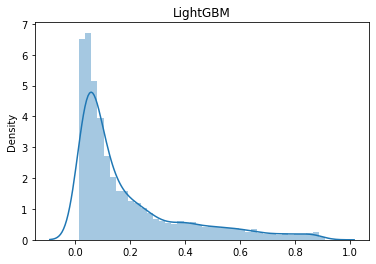

In [ ]:
sns.distplot(test_preds)
plt.title('LightGBM')
plt.show()

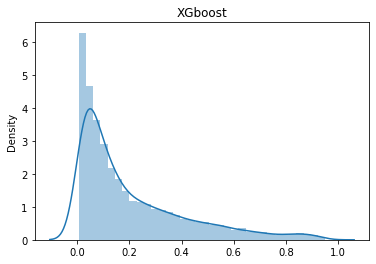

In [ ]:
sns.distplot(test_preds2)
plt.title('XGboost')
plt.show()

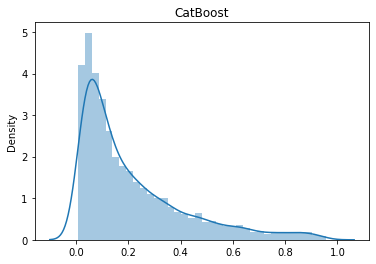

In [ ]:
sns.distplot(test_preds3)
plt.title('CatBoost')
plt.show()

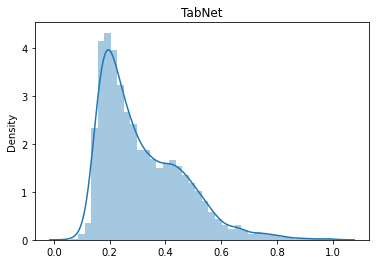

In [ ]:
sns.distplot(test_preds4)
plt.title('TabNet')
plt.show()

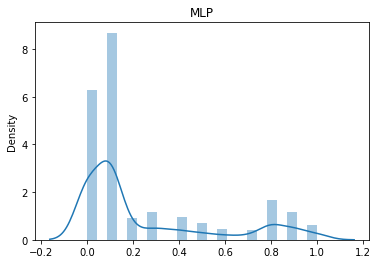

In [ ]:
sns.distplot(test_preds5)
plt.title('MLP')
plt.show()

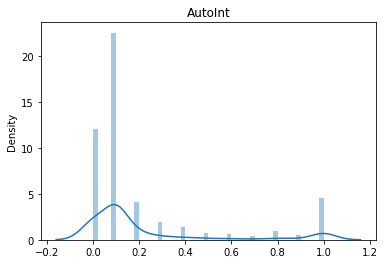

In [ ]:
sns.distplot(test_preds6)
plt.title('AutoInt')
plt.show()

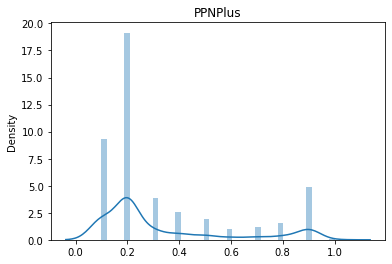

In [ ]:
sns.distplot(test_preds7)
plt.title('PPNPlus')
plt.show()